In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
import chromATAC as ca
from chromATAC.integrated import IntData
from functools import reduce
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import matplotlib.gridspec as gridspec

In [3]:
parent_dir = '/Users/mossishahi/Code/lupien/IntData/'

In [4]:
def Clustered_TEs(chromosome_layer, **kwargs):
    resolution = kwargs.get('resolution')
    conditions = {}
    annotations = {}
    resolution = kwargs.get('resolution')
    ann = {0:'TE with no defined CORTE in any chromosome', 1:'TE with defined CORTEs'}
    for chr in range(1, 25):
        idx = np.array([i.split('>')[-1] for i in ind.chr.layers[resolution]['TEs']['index'][chr]])
        conditions[chr] = np.array([int(i in idx) for i in chromosome_layer['index'][chr]])
        annotations[chr] = ann
    return conditions, annotations

def get_cancertype(chromosome_layer, **kwargs):
    conditions = {}
    annotations = {}
    resolution=kwargs.get('resolution')
    ann = {i:v for i, v in enumerate(tcga_met[' Project'].apply(lambda x:x.split('TCGA-')[-1]).unique())}
    mapping = {v:i for i, v in enumerate(tcga_met[' Project'].apply(lambda x:x.split('TCGA-')[-1]).unique())}
    for chr in ca.info.CHROMOSOMES['numericals'].values():
        samples = chromosome_layer['index'][chr]
        conditions[chr] = [mapping[i.split('_')[0].split('>')[-1]] for i in ind.chr.layers[resolution]['TCGA']['index'][chr]]
        annotations[chr] = ann
    return conditions, annotations
    
def CTeCore_filter(chromosome_layer, **kwargs):
    conditions = {}
    annotations = {}    
    ann = {0:'TEs with No Significant Difference between #Cores and #Elements in this Chromosome', 1:'TEs with Significant Difference between #Cores and #Elements in this Chromosome'}
    index = kwargs.get('index')
    test_res = kwargs.get('test_res')
    maj = kwargs.get('majority', 3)
    for chr in range(1, 25):
        idx = np.array([i.split('>')[-1] for i in index[test_res[:, chr-1]>=maj]])
        conditions[chr] = np.array([int(i.split('>')[-1] in idx) for i in chromosome_layer['index'][chr]])
        annotations[chr] = ann
    return conditions, annotations

def GTeCore_filter(genome_layer, **kwargs):
    conditions = {}
    annotations = {}
    ann = {0:'TEs with No Significant Difference between #Cores and #Elements in this Chromosome', 1:'TEs with Significant Difference between #Cores and #Elements in this Chromosome'}
    index = kwargs.get('index')
    test_res = kwargs.get('test_res')
    maj = kwargs.get('majority', 3)
    for chr in range(1, 25):
        idx = np.array([i.split('>')[-1] for i in index[test_res[:, chr-1]>=maj]])
        conditions[chr] = np.array([int(i.split('>')[-1] in idx) for i in genome_layer['index']])
        annotations[chr] = ann
    return conditions, annotations

def save_correlation(omic, layers, resolution, chr='all', path=".", cmp_method='sim'):
    metrs = ['score', 'pvalue']
    if chr=='all':
        chr=ca.info.CHROMOSOMES['names']
    if not isinstance(chr, list):
        chr = [chr]
    for c in chr:
        path = os.path.join(path, cmp_method+f'/{c}')
        if not os.path.exists(path):
            os.makedirs(path)
        for m in metrs:
            for k, v in omic.layers[resolution]['co'][tuple(sorted(set(layers)))][cmp_method][c][m].items():
                v.to_csv(f'{path}/{c}_{k}_{m}.csv')
                
def Cnv_cancertype(chromosome_layer, **kwargs):
    conditions = {}
    annotations = {}
    ann = {i:cancer for i, cancer in enumerate(cnv_meta['cancer_type'].unique())}
    con =  {cancer:i for i, cancer in enumerate(cnv_meta['cancer_type'].unique())}
    for c in tqdm(range(1, 25)):
        samples = chromosome_layer['index'][c]
        conditions[c] = np.array([con[cnv_meta.iloc[np.where(cnv_meta['name']==sample.split(">")[-1])[0]]['cancer_type'].values.item()] for sample in samples if sample.split(">")[-1] in cnv_meta['name'].values])
        annotations[c] = ann
    return conditions, annotations

In [5]:
def cnv_gain(matrix):
    m = matrix.copy()
    m[m<=2]=0
    m[m!=0]=1
    return m
def cnv_loss(matrix):
    m = matrix.copy()
    m[m>=2]=0
    m[m!=0]=1
    return m

In [6]:
def cote_present(matrix):
    matrix = matrix.copy()
    matrix[matrix>0]=1
    return matrix

### TE and COTEs

In [8]:
ind = IntData()

ind.add_layer("TEs", input=parent_dir+'/data/V2-TEs/non_olap', index_mapper=lambda x: x.split("_Merged.bed")[0])
ind.add_layer("CoTEs", input=parent_dir+'/data/V2-TEs/cores1000', index_mapper=lambda x: x.split("_Merged.bed")[0])
ind.chr.add_filter('COTE', Clustered_TEs, ['TEs'])

loading files from: /Users/mossishahi/Code/lupien/IntData//data/V2-TEs/non_olap


100%|█████████████████████████████████████████████████████████████████████████████████| 975/975 [00:08<00:00, 109.57it/s]


loading files from: /Users/mossishahi/Code/lupien/IntData//data/V2-TEs/cores1000


100%|████████████████████████████████████████████████████████████████████████████████| 456/456 [00:00<00:00, 1394.32it/s]


In [9]:
def TE_family(chromosome_layer, **kwargs):
    conditions = {}
    annotations = {}    
    ann = {i:te.split('>')[-1] for i, te in enumerate(ind.chr.layers[1e06]['TEs']['index'][1])}
    con = {te.split('>')[-1]:i for i, te in enumerate(ind.chr.layers[1e06]['TEs']['index'][1])}
    for chr in range(1, 25):
        conditions[chr] = np.array([con[i.split('>')[-1]] for i in chromosome_layer['index'][chr]])
        annotations[chr] = ann
    return conditions, annotations

In [10]:
def CoTE_family(chromosome_layer, **kwargs):
    conditions = {}
    annotations = {}    
    ann = {i:te.split('>')[-1] for i, te in enumerate(ind.chr.layers[1e06]['CoTEs']['index'][1])}
    con = {te.split('>')[-1]:i for i, te in enumerate(ind.chr.layers[1e06]['CoTEs']['index'][1])}
    for chr in range(1, 25):
        conditions[chr] = np.array([con[i.split('>')[-1]] for i in chromosome_layer['index'][chr]])
        annotations[chr] = ann
    return conditions, annotations

In [11]:
ind.chr.add_filter('te_family', TE_family, ['TEs'])
ind.chr.add_filter('cote_family', CoTE_family, ['CoTEs'])

In [12]:
def cdriver_cancertype(chromosome_layer, **kwargs):
    conditions = {}
    annotations = {}
    ann = {i:cancer for i, cancer in enumerate(cnv_meta['cancer_type'].unique())}
    con = {cancer:i for i, cancer in enumerate(cnv_meta['cancer_type'].unique())}
    for chr in tqdm(range(1, 25)):
        samples = chromosome_layer['index'][chr]
        conditions[chr] = np.array([con[cnv_meta.iloc[np.where(cnv_meta['name']==sample.split(">")[-1])[0]]['cancer_type'].values.item()] for sample in samples if sample.split(">")[-1] in cnv_meta['name']])
        annotations[chr] = ann
    return conditions, annotations

### CNVAR

In [21]:
cnv_sig = pd.read_csv('cnv_sig_reformed.bed', sep='\t')

In [23]:
cnv_sig = cnv_sig.iloc[:, 1:8]

In [25]:
cnv_meta = pd.read_csv(parent_dir+"/data/CNVAR/summary.ascatv3TCGA.penalty70.hg38.tsv", sep='\t')

In [26]:
cnv_sig['n_copies']=cnv_sig['n_Major']+cnv_sig['n_Minor']

In [27]:
sample_sig = pd.read_excel(parent_dir+'data/CNVAR/sample_signature.xlsx', sheet_name='Pancan sig attributions')

In [28]:
def cnv_class_filter(row, **kwargs):
    index_col=kwargs.get('index_col')
    return bool(sample_sig.loc[row.iloc[index_col], row.loc['CN']])

In [29]:
sample_sig = sample_sig.set_index('Sample')

In [31]:
cnv_sig

,chr,start,end,sample,n_Major,n_Minor,CN,n_copies
0,chr1,61735,73920815,TCGA-02-0001,2,1,CN2,3
1,chr1,73921308,74915495,TCGA-02-0001,2,0,CN2,2
2,chr2,12784,56875222,TCGA-02-0001,2,1,CN2,3
3,chr2,56876468,74466857,TCGA-02-0001,1,0,CN9,1
4,chr2,98892403,109667559,TCGA-02-0001,3,1,CN2,4
...,...,...,...,...,...,...,...,...
753440,chr17,150733,3116431,TCGA-ZX-AA5X,2,2,CN2,4
753441,chr17,3116496,21288047,TCGA-ZX-AA5X,2,0,CN2,2
753442,chr18,48133,80257174,TCGA-ZX-AA5X,2,2,CN2,4
753443,chr22,33352376,50796027,TCGA-ZX-AA5X,4,0,CN2,4


In [32]:
ind.add_layer("CNVAR", input=cnv_sig, 
              feature_type='signal', 
              index_col=3, 
              feature_column=7, 
              resolutions=[1e06, 1e07],
              filter_function = cnv_class_filter)

100%|████████████████████████████████████████████████████████████████████████████████| 9699/9699 [04:38<00:00, 34.80it/s]


In [33]:
ind.chr.add_filter('Cancertype', Cnv_cancertype, ['CNVAR'])

100%|████████████████████████████████████████████████████████████████████████████████████| 24/24 [01:34<00:00,  3.94s/it]


In [34]:
ca.pl.plot_layer(ind.chr, 'CNVAR', chrom='chr7', groups={'Cancertype':'GBM'})

IndexError: boolean index did not match indexed array along dimension 0; dimension is 9699 but corresponding boolean dimension is 9498

In [13]:
parent_dir+'analysis/data/V2-TEs/non_olap'

'/Users/mossishahi/Code/lupien/IntData/analysis/data/V2-TEs/non_olap'

In [14]:
df = pd.read_csv(parent_dir+'analysis/notebooks/positive_table_1128.txt', sep='\t')
df = df.rename(columns={'Unnamed: 0':'te_family'})
df.set_index('te_family')
df.sort_values('chr7', ascending=False)

,te_family,chr1,chr2,chr3,chr4,chr5,chr6,chr7,chr8,chr9,...,chr15,chr16,chr17,chr18,chr19,chr20,chr21,chr22,chrX,chrY
223,MLT1I,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
100,ERVL-B4-int,1,0,0,0,0,1,1,1,0,...,0,0,1,0,0,0,0,0,0,0
140,Charlie1b,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
135,MER58D,0,0,0,0,0,1,1,0,0,...,0,0,0,1,0,0,0,0,0,0
132,Charlie7a,0,0,0,1,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,AluYk3,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
169,Tigger2a,0,0,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
168,MER41B,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
167,HERV16-int,0,0,1,0,0,0,0,0,1,...,1,0,0,0,0,0,0,0,0,0


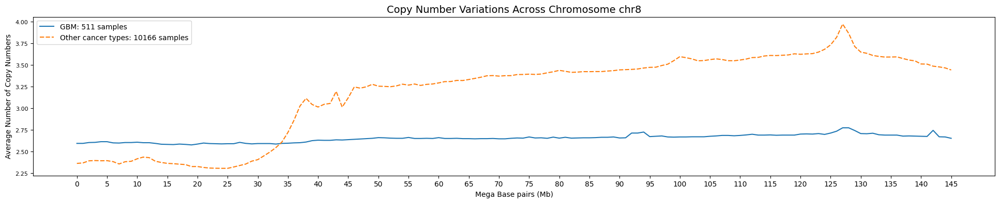

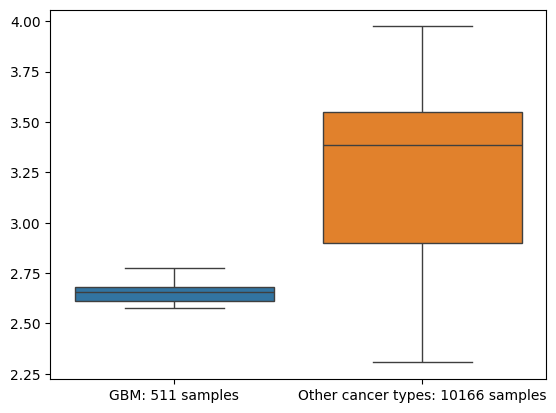

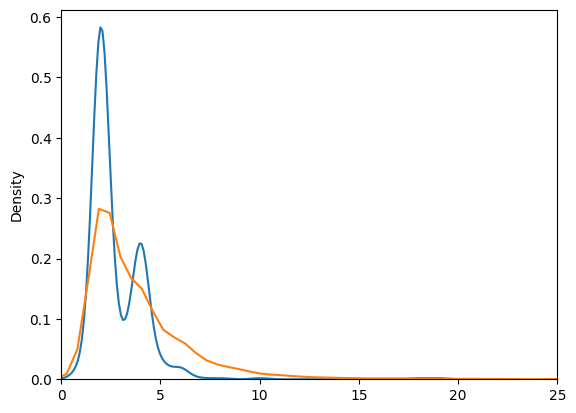

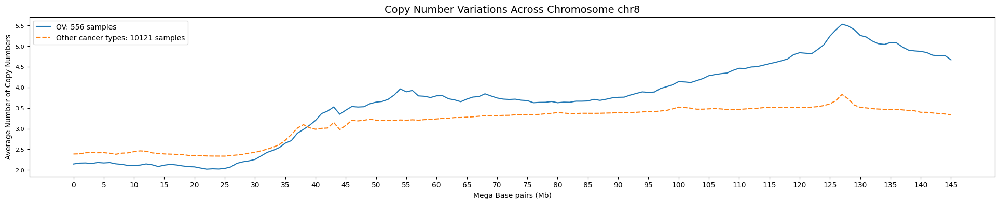

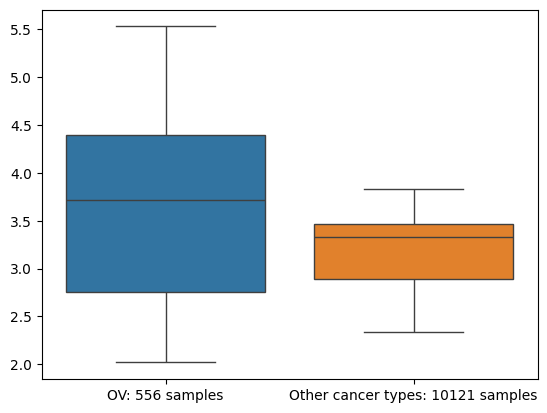

...

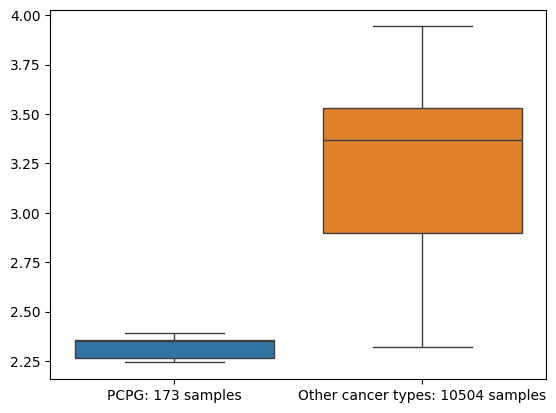

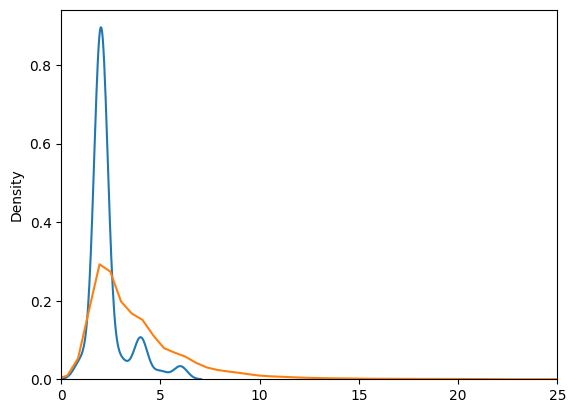

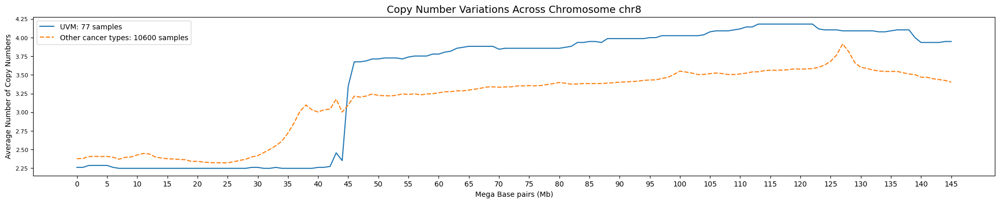

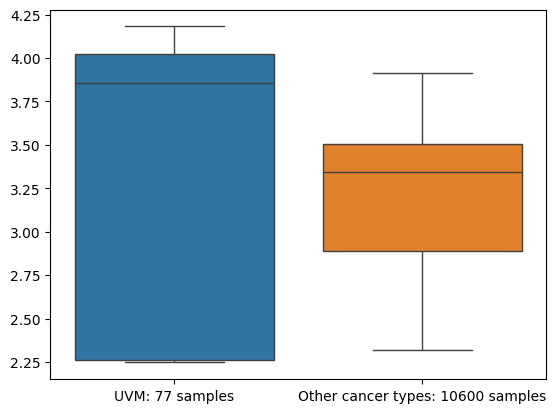

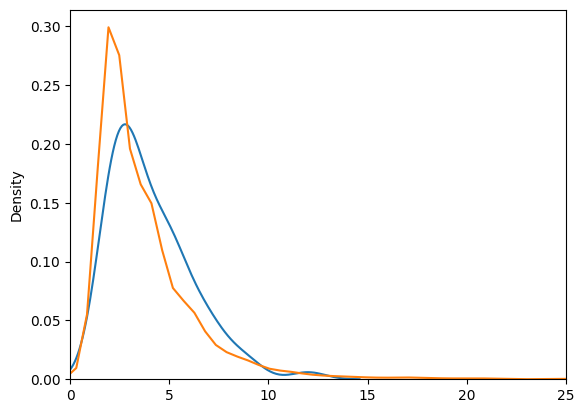

In [45]:
c = 'chr8'
for ct in cnv_meta.cancer_type.unique():
    f = ind.chr.get_layer('CNVAR', groups={'Cancertype':ct}, chrom=c)
    d = f[f'Cancertype:{ct}']['data']
    nf = ind.chr.get_layer('CNVAR', groups={'Cancertype':ct}, chrom=c, reverse_filter=True)
    nd = nf[f'Cancertype:{ct}']['data']
    df = pd.DataFrame(np.vstack([d.mean(0).T, nd.mean(0).T]), index=[f'{ct}: {d.shape[0]} samples', f'Other cancer types: {nd.shape[0]} samples']).T
    plt.figure(figsize=(24, 4))
    plt.title(f'Copy Number Variations Across Chromosome {c}', fontsize=14)
    plt.xlabel('Mega Base pairs (Mb)')
    plt.ylabel('Average Number of Copy Numbers')
    plt.xticks(np.arange(0, d.shape[1], 5))
    plt.yticks(fontsize=8)
    sns.lineplot(df)
    plt.savefig(f'{ct}_atac_chr{c}.png', bbox_inches='tight')
    plt.show()
    sns.boxplot(df)
    plt.show()
    sns.kdeplot(d[:, 127])
    sns.kdeplot(nd[:, 127])
    plt.xlim(0, 25)

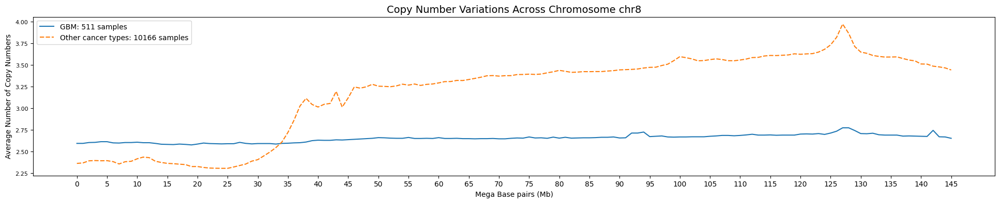

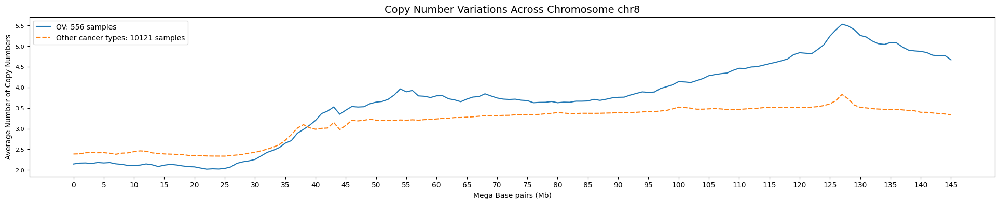

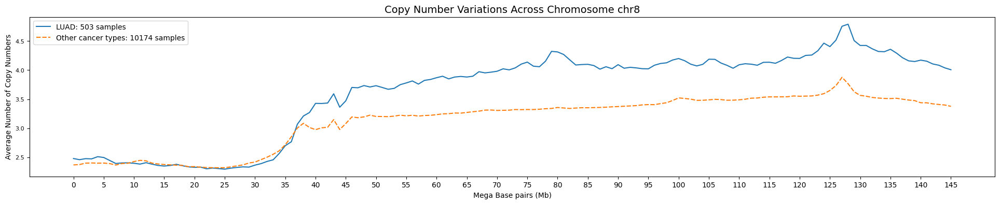

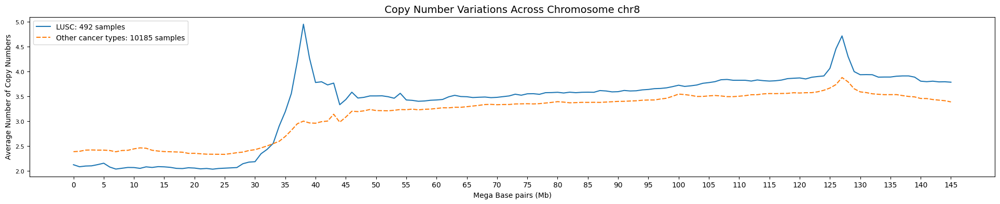

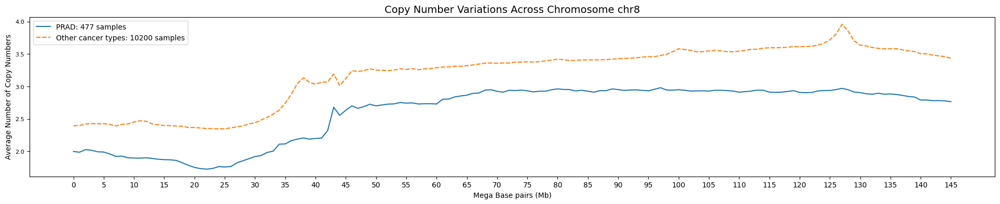

...

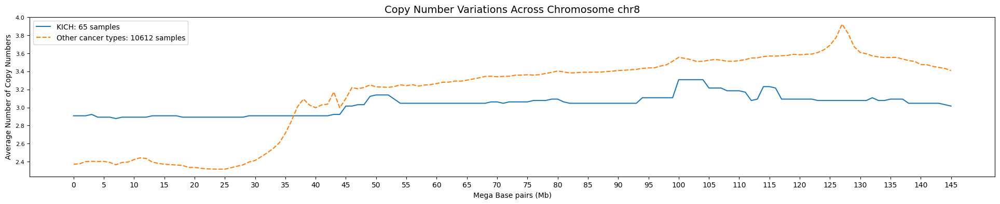

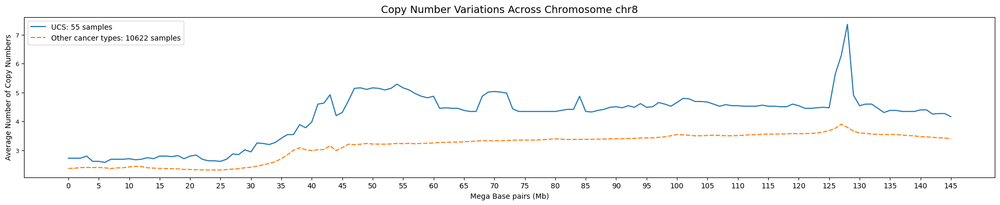

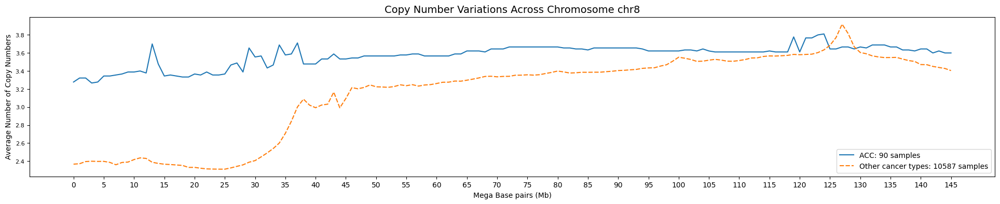

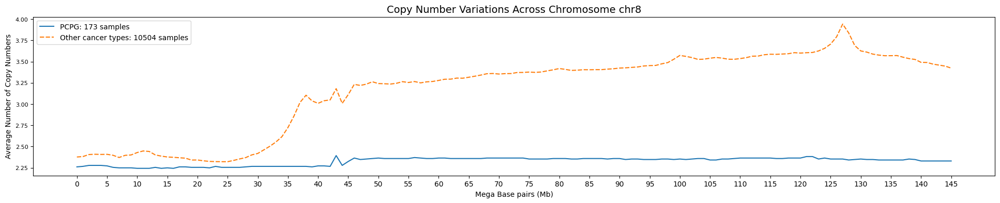

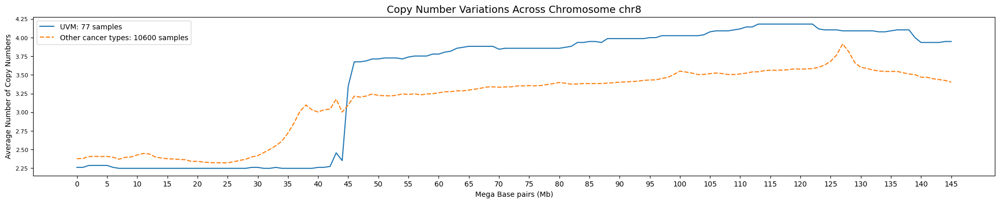

In [25]:
c = 'chr8'
for ct in cnv_meta.cancer_type.unique():
    f = ind.chr.get_layer('CNVAR', groups={'Cancertype':ct}, chrom=c)
    d = f[f'Cancertype:{ct}']['data']
    nf = ind.chr.get_layer('CNVAR', groups={'Cancertype':ct}, chrom=c, reverse_filter=True)
    nd = nf[f'Cancertype:{ct}']['data']
    df = pd.DataFrame(np.vstack([d.mean(0).T, nd.mean(0).T]), index=[f'{ct}: {d.shape[0]} samples', f'Other cancer types: {nd.shape[0]} samples']).T
    plt.figure(figsize=(24, 4))
    plt.title(f'Copy Number Variations Across Chromosome {c}', fontsize=14)
    plt.xlabel('Mega Base pairs (Mb)')
    plt.ylabel('Average Number of Copy Numbers')
    plt.xticks(np.arange(0, d.shape[1], 5))
    plt.yticks(fontsize=8)
    sns.lineplot(df)
    plt.savefig(f'{ct}_atac_chr{c}.png', bbox_inches='tight')
    plt.show()

In [156]:
for ct in cnv_meta.cancer_type.unique()[:1]:
    f = ind.chr.get_layer('CNVAR', groups={'Cancertype':ct}, chr='chr19')
    amp = f['Cancertype'][ct]['data'].copy()
    amp[amp<=2] = 0
    amp_nz = np.array([sum(arr>0) for arr in amp.T])
    amp_nz_means = np.array([np.mean(column[column > 0]) if np.any(column > 0) else 0 for column in amp.T])
    sup = f['Cancertype'][ct]['data'].copy()
    sup[sup>=2] = 0
    sup_nz_means = np.array([np.mean(column[column > 0]) if np.any(column > 0) else 0 for column in sup.T])
    sup_nz = np.array([sum(arr>0) for arr in sup.T])
    norm = f['Cancertype'][ct]['data'].copy()
    norm[norm!=2] = 0
    norm_nz_means = np.array([np.mean(column[column > 0]) if np.any(column > 0) else 0 for column in norm.T])
    norm_nz = np.array([sum(arr>0) for arr in norm.T])

In [102]:
import numpy as np

def find_outliers_zscore(data, threshold=3):
    """
    Identify outliers in a numpy array based on the Z-score method.

    :param data: Numpy array containing the data
    :param threshold: The number of standard deviations from the mean 
                      to consider a data point an outlier.
    :return: A list of indices of the outliers.
    """
    if not isinstance(data, np.ndarray):
        raise ValueError("Input must be a NumPy array")
        
    mean = np.mean(data)
    std = np.std(data)
    z_scores = (data - mean) / std

    amp_outlier_indices = np.where(z_scores > threshold)[0]
    sup_outlier_indices = np.where(z_scores < -1*threshold)[0]

    return amp_outlier_indices.tolist(), sup_outlier_indices.tolist()


In [170]:
def plot_ridge_rows(data, index_col=None, subset_size=None):
    """
    Generate overlapping density plots (ridge plots) for each row in the dataframe.

    Parameters:
    - data: pandas DataFrame, where each row is considered as a distribution.
    - index_col: str or int, optional, column to be used as an index or identifier for each distribution.
    - subset_size: int, optional, number of rows to include in the plot for efficiency.
    """
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0)})

    # If a subset is specified, randomly select a subset of rows
    if subset_size is not None and subset_size < len(data):
        data = data.sample(n=subset_size)

    # Transform the data into a long format
    if index_col is not None:
        melted_df = data.reset_index().melt(id_vars=[index_col], var_name='Variable', value_name='Value')
        labels = data[index_col].astype(str)
    else:
        melted_df = data.reset_index().melt(id_vars=['index'], var_name='Variable', value_name='Value')
        labels = melted_df['index'].astype(str)

    # Create the FacetGrid object
    num_distributions = len(labels.unique())
    pal = sns.cubehelix_palette(num_distributions, rot=-.25, light=.7)
    g = sns.FacetGrid(melted_df, row="index", hue="index", aspect=10, height=.4, palette=pal)

    # Draw the densities
    g.map(sns.kdeplot, "Value", bw_adjust=.5, clip_on=False, fill=True, alpha=1, linewidth=1.5)
    g.map(sns.kdeplot, "Value", clip_on=False, color="w", lw=2, bw_adjust=.5)
    g.refline(y=0, linewidth=2, linestyle="-", color=None, clip_on=False)

    # Label the plot
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label, fontweight="bold", color=color, ha="left", va="center", transform=ax.transAxes)
    g.map(label, "Value")

    # Set the subplots to overlap
    g.figure.subplots_adjust(hspace=-.25)

    # Remove axes details that don't play well with overlap
    g.set_titles("")
    g.set(yticks=[], ylabel="")
    g.despine(bottom=True, left=True)

    return g

/Users/mossishahi/miniconda3/envs/shirin/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Users/mossishahi/miniconda3/envs/shirin/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Users/mossishahi/miniconda3/envs/shirin/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)
/Users/mossishahi/miniconda3/envs/shirin/lib/python3.12/site-packages/seaborn/axisgrid.py:123: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all

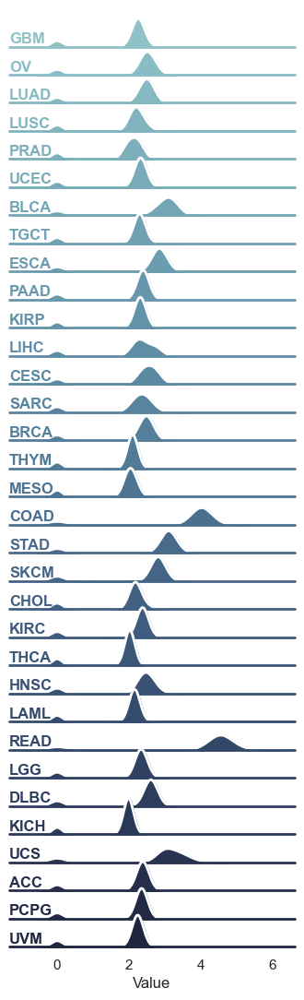

In [178]:
c = 'chr13'
cpan = ind.chr.get_layer('CNVAR', groups={'Cancertype':'all'}, chr=c)['Cancertype']
mean_cpan = np.vstack([v['data'].mean(0) for k, v in cpan.items()])
df = pd.DataFrame(mean_cpan, index=idx_cpand)
g = plot_ridge_rows(df)
g.savefig(f'facet_cnv_chr_{c}.png')

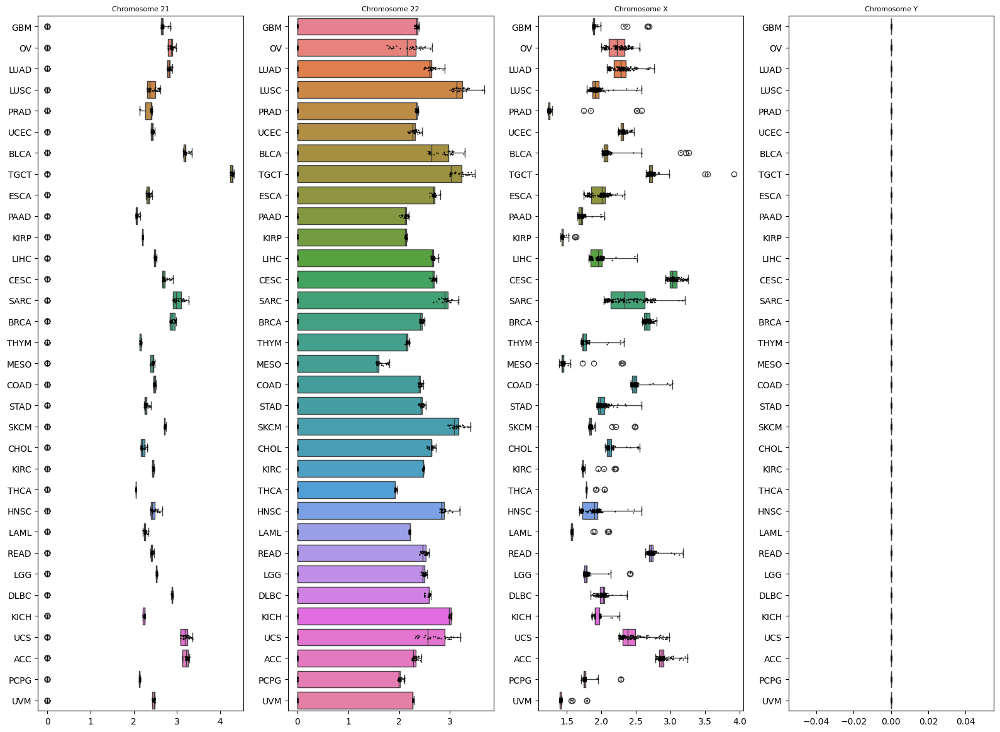

In [131]:
bunch=6
fig, axs = plt.subplots(1, 4, figsize=(16, 12))
for i, c in enumerate(ca.info.CHROMOSOMES['names'][4*(bunch):4*(bunch+1)]):
    axs = axs.flatten()
    cpan = ind.chr.get_layer('CNVAR', groups={'Cancertype':'all'}, chr=c)['Cancertype']
    mean_cpan = np.vstack([v['data'].mean(0) for k, v in cpan.items()])
    idx_cpand = [k for k, v in cpan.items()]
    df_mean_cpan = pd.DataFrame(mean_cpan, index=idx_cpand)
    sns.stripplot(df_mean_cpan.T, jitter=True, color='black', size=1.5,  orient='h', ax=axs[i%4])
    sns.boxplot(df_mean_cpan.T, orient='h', whis=10, ax=axs[i%4])
    axs[i].set_title(f'Chromosome {c.split('chr')[-1]}', fontsize=8)
    plt.subplots_adjust(hspace=0.5, wspace=0.5)
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    fig.savefig(f'cnv_box_chrs_b{bunch}.png')
# plt.suptitle('The distribution of Copy numbers across different chromosomes in sample from various cancer types', fontsize=20)
# plt.show()

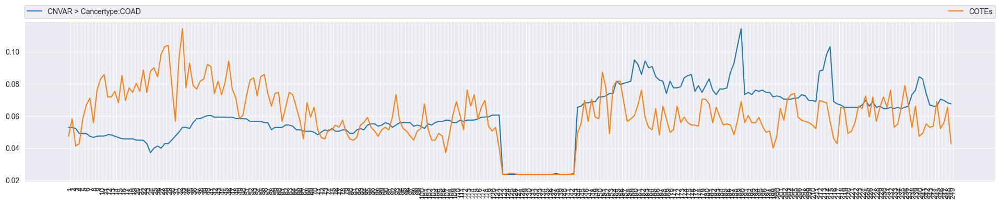

In [17]:
ca.pl.match_layers(ind.chr, ['CNVAR', 'COTEs'] , chr=1, aggregation='sum', normal_y=True, groups={'CNVAR':{'Cancertype':'COAD'}})

In [99]:
pca_transformed, group_assignments = ca.al.group_signals(x)

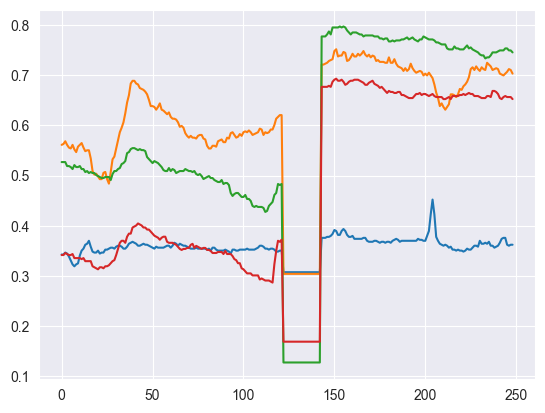

In [109]:
plt.plot(y)

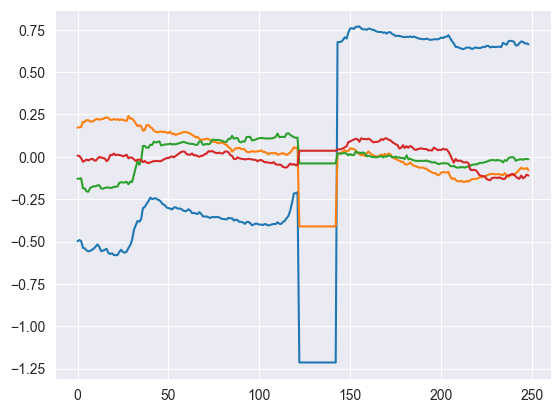

In [111]:
plt.plot(-1*pca_transformed)

<Axes: >

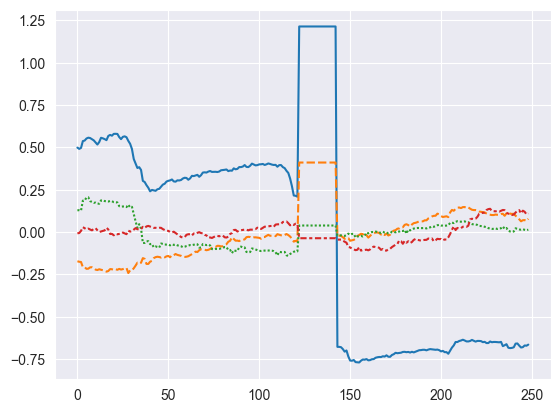

In [105]:
sns.lineplot(pd.DataFrame(pca_transformed), legend=False)

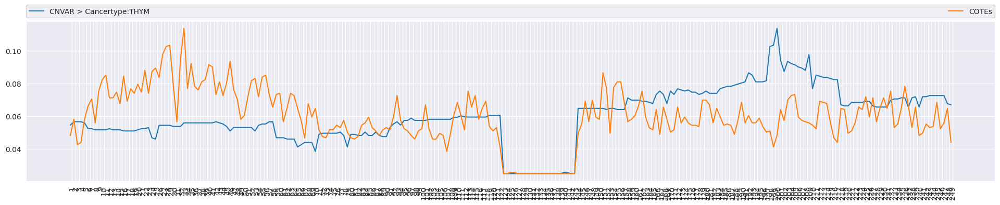

In [88]:
ca.pl.match_layers(ind.chr, ['CNVAR', 'COTEs'] , chr=1, aggregation='sum', normal_y=True, groups={'CNVAR':{'Cancertype':'THYM'}}, qnormalize=True)

In [ ]:
ca.pl.match_layers(ind.chr, ['CNVAR', 'COTEs'] , chr=1, aggregation='sum', normal_y=True, groups={'CNVAR':{'Cancertype':'BRCA'}})

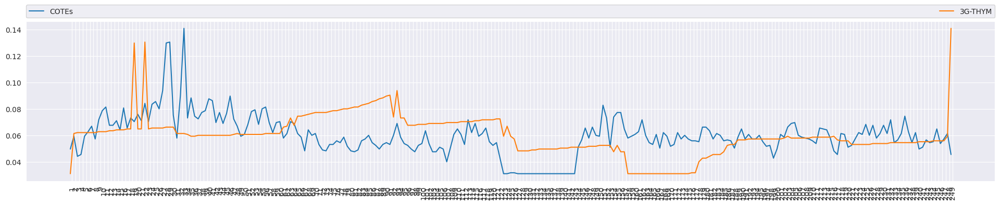

In [87]:
ca.pl.match_layers(ind.chr, ['COTEs', '3G-THYM'] , chr=1, aggregation='sum', normal_y=True, qnormalize=True)

In [15]:
x = np.vstack([cnv_gain(ind.chr.get_layer('CNVAR', chr='chr1', groups={'Cancertype':c})['Cancertype'][c]['data']).mean(0) for c in cnv_meta.cancer_type.unique()])
pca_transformed, group_assignments = ca.al.group_signals(x, method='pca')

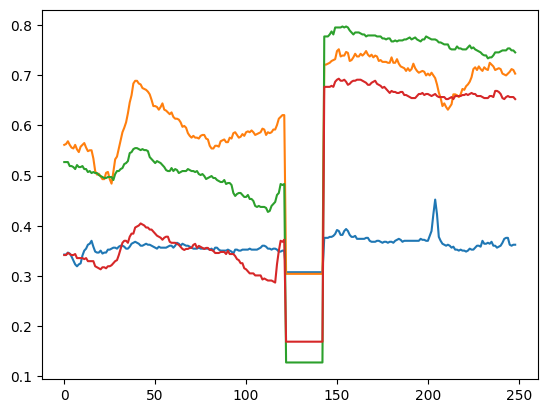

In [17]:
plt.plot(pca_transformed)

<Axes: >

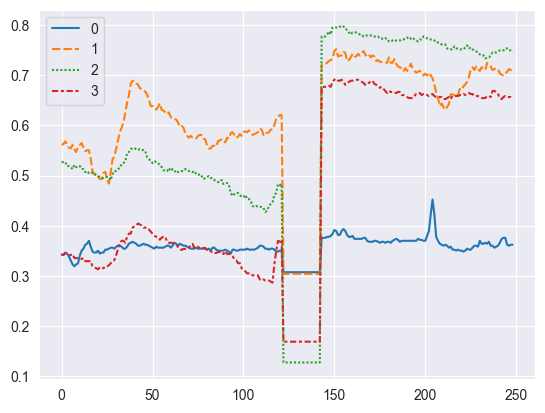

In [117]:
sns.lineplot(pd.DataFrame(pca_transformed))

<Axes: >

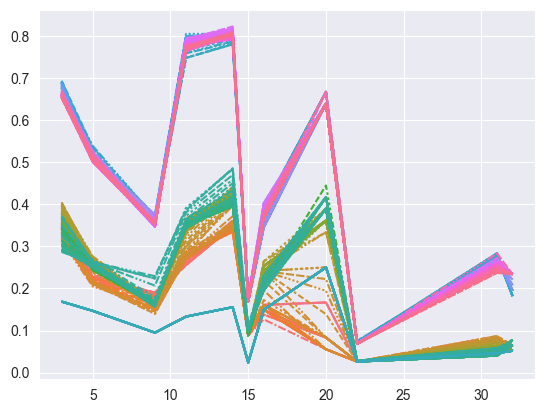

In [136]:
cmap = {1:'red', 2:'blue', 3:'orange', 0:'red'}
sns.lineplot(df.loc[[i==3 for i in group_assignments],:], legend=False)

<Axes: >

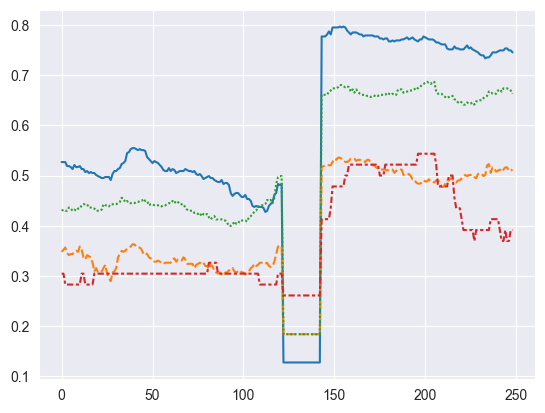

In [137]:
cmap = {1:'red', 2:'blue', 3:'orange', 0:'red'}
sns.lineplot(df.loc[[i==2 for i in group_assignments],:].T, legend=False)

In [19]:
df = pd.DataFrame(x)

In [21]:
df.to_csv('data.csv')

<Axes: >

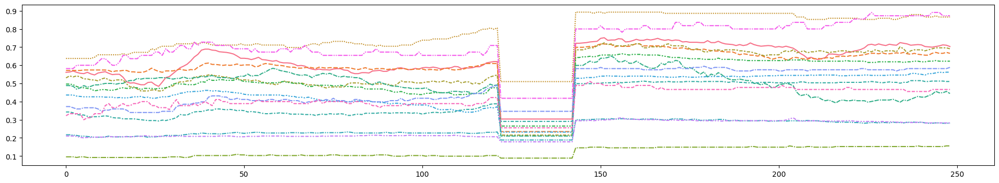

In [20]:
cmap = {1:'red', 2:'blue', 3:'orange', 0:'red'}
plt.figure(figsize=(24, 4))
sns.lineplot(df.loc[[i==1 for i in group_assignments],:].T, legend=False)

<Axes: >

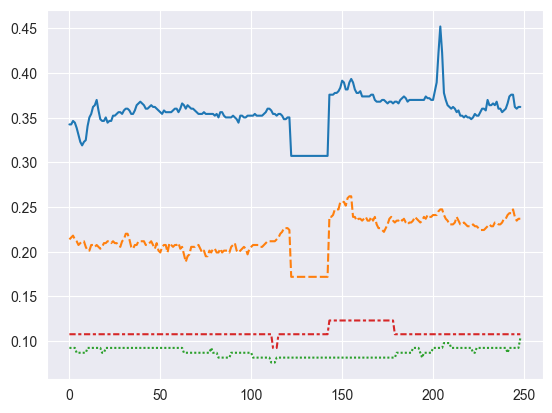

In [139]:
cmap = {1:'red', 2:'blue', 3:'orange', 0:'red'}
sns.lineplot(df.loc[[i==0 for i in group_assignments],:].T, legend=False)

In [118]:
df = pd.DataFrame(x)

<Axes: >

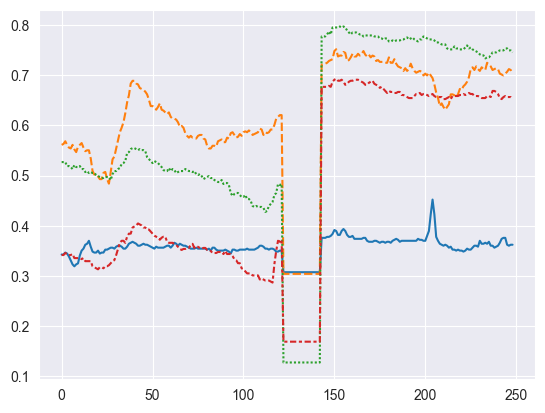

In [70]:
y = ca.tl.pca(np.transpose(x), 0.99)
# plt.legend()
sns.lineplot(pd.DataFrame(y), legend=False)

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

<AxesSubplot: >

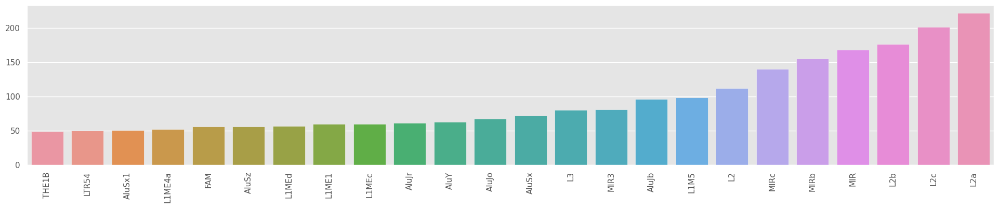

In [129]:
plt.figure(figsize=(24, 4))
plt.xticks(rotation=90)
sns.barplot(pd.DataFrame(cote_present(s['data']).sum(-1), index=[i.split('_')[-1] for i in s['index']], columns=['n_CoTE']).sort_values('n_CoTE').iloc[-24:, ].T)

In [110]:
ind.chr.get_layer('COTEs', chr=1, groups={'te_family':[i.split('>')[-1] for i in s['index']]})


KeyboardInterrupt



/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

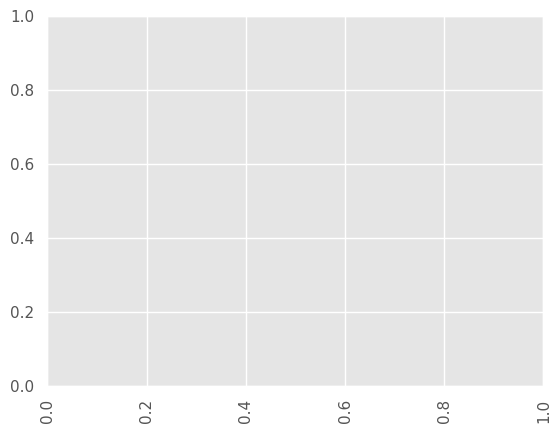

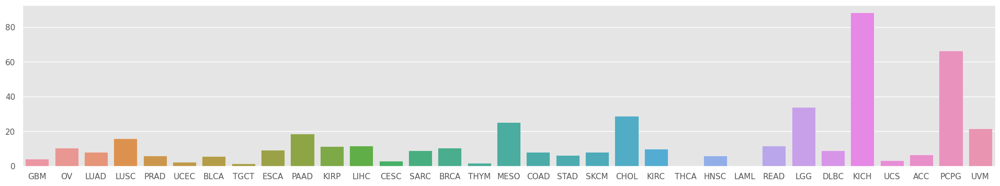

In [105]:
plt.xticks(rotation=90)
plt.figure(figsize=(24, 4))
sns.barplot(pd.DataFrame(f1, index=np.arange(1, 2)))
plt.show()

In [73]:
fff.to_csv('here.csv')

### Cancer driver Genes

In [3]:
cdriver = pd.read_csv('/cluster/home/t124771uhn/data/cancer_drivers/integrated_Unfiltered_drivers.tsv', sep='\t')

In [113]:
metrics['cosine_sim']['chr1']

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:HNSC,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM
0,0.967,0.459,0.728,0.719,0.953,0.938,0.514,0.599,0.909,0.947,...,0.531,0.999,0.680,0.933,0.102,0.904,0.436,0.997,0.863,0.979
1,0.965,0.292,0.034,0.010,0.997,0.050,0.019,0.984,0.636,0.501,...,0.906,0.974,0.077,0.646,0.020,0.993,0.017,0.826,0.173,0.979
2,0.995,0.819,0.695,0.727,0.939,0.646,0.559,0.171,0.453,0.170,...,0.997,1.000,0.414,0.984,0.788,0.934,0.470,0.600,0.896,0.871
3,0.967,0.341,0.573,0.584,0.731,0.591,0.854,0.567,0.347,0.529,...,0.727,0.965,0.529,0.893,0.999,0.919,0.835,0.950,0.948,0.417
4,0.012,0.317,0.970,0.999,0.058,0.969,0.447,0.002,0.652,1.000,...,0.000,0.997,1.000,0.989,0.746,0.697,0.836,0.655,0.999,1.000
5,0.995,0.763,0.355,0.223,0.951,0.211,0.997,0.994,0.374,0.368,...,0.470,0.852,0.426,0.800,0.982,0.909,0.864,0.889,0.532,0.304
6,0.391,0.016,0.857,0.814,0.361,0.717,0.427,0.633,0.887,0.997,...,0.004,0.397,0.616,0.984,0.656,0.417,0.019,0.987,0.926,0.998
7,0.769,0.236,0.941,0.992,0.286,0.999,0.418,0.590,0.580,0.990,...,0.010,0.938,0.990,1.000,0.546,0.596,0.237,0.971,0.973,1.000
8,0.982,0.428,0.498,0.205,0.934,0.690,0.184,0.980,0.668,0.607,...,0.915,0.939,0.263,0.792,0.313,0.910,0.743,0.273,0.423,0.785
9,0.037,0.969,1.000,1.000,0.000,0.989,1.000,0.016,0.964,0.421,...,0.959,0.000,0.052,0.010,0.220,0.000,0.978,0.002,0.979,0.000


In [67]:
scores = {'cosine_sim':{i:[] for i in ca.info.CHROMOSOMES['names']}, 'spearman_correlation':{i:[] for i in ca.info.CHROMOSOMES['names']}, 'correlation_coefficient':{i:[] for i in ca.info.CHROMOSOMES['names']}}
pvalues = {'cosine_sim':{i:[] for i in ca.info.CHROMOSOMES['names']}, 'spearman_correlation':{i:[] for i in ca.info.CHROMOSOMES['names']}, 'correlation_coefficient':{i:[] for i in ca.info.CHROMOSOMES['names']}}
parent = "/cluster/home/t124771uhn/analysis/experiment5/subset/"
for chr in ca.info.CHROMOSOMES['names'][:-1]:
    for subset in os.listdir(parent):
        for m in scores.keys():
            score = pd.read_csv(f"/cluster/home/t124771uhn/analysis/experiment5/subset/{subset}/{chr}_{m}_score.csv", index_col=False)
            scores[m][chr].append(score)
            pval = pd.read_csv(f"/cluster/home/t124771uhn/analysis/experiment5/subset/{subset}/{chr}_{m}_pvalue.csv", index_col=False)
            pvalues[m][chr].append(pval)

In [98]:
tes_dir = '/cluster/home/t124771uhn/data/V2-TEs/non_olap'
cotes_dir = '/cluster/home/t124771uhn/data/V2-TEs/non_olap/cores1000/'
TEs = np.array([i.split('.')[0] for i in os.listdir(tes_dir) if i.endswith('.bed')])
COTES = np.array([i.split('.')[0] for i in os.listdir(cotes_dir) if i.endswith('.bed')])
te_meta = pd.read_csv('/cluster/home/t124771uhn/analysis/repeat_metadata.onlyTEs_full.txt', sep='\t')
te_df = te_meta.iloc[np.concatenate([np.where(te_meta['repname_numbered'].apply(lambda x: i.split('_')[0]==x.split('_')[0]))[0] for i in TEs]), :].loc[:, ['repname', 'Superfamily', 'repname_numbered']].copy()
te_df.index = range(1, len(te_df)+1)
te_df['COTE'] = te_df['repname_numbered'].apply(lambda x: x.split('_')[0] in np.array([i.split('_')[0] for i in np.intersect1d(TEs, COTES)]))
te_df.loc[971] = ['ERV3-16A3_I-int', 'ERVL', '369_ERV3-16A3_I-int', True]

In [143]:
def metric_visualization(d, chr='chr8'):
    df = pd.concat(d[chr])
    df = df.set_index('Unnamed: 0')
    _df = df.loc[pd.Series(df.index).apply(lambda x: x.split('>')[-1] in te_df[te_df.Superfamily=='LINE1']['repname_numbered'].values).values, :].dropna()
    sns.clustermap(_df, figsize=(24, 24), annot=True)
    return _df

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

<AxesSubplot: >

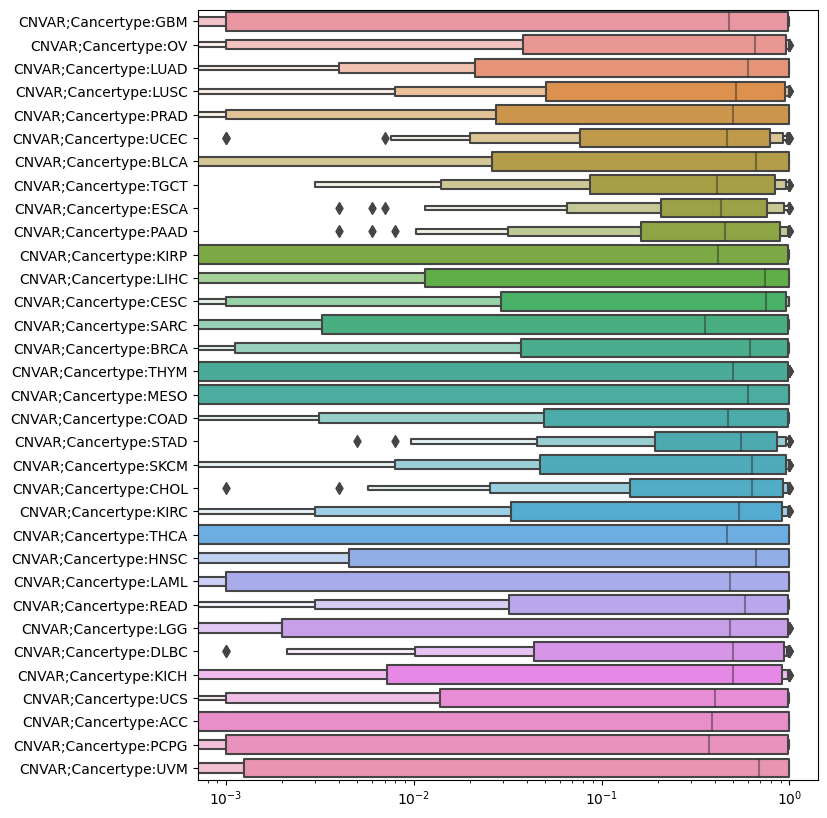

In [172]:
plt.figure(figsize=(8, 10))
plt.xscale('log')
sns.boxenplot(df, orient='h', dodge=True)

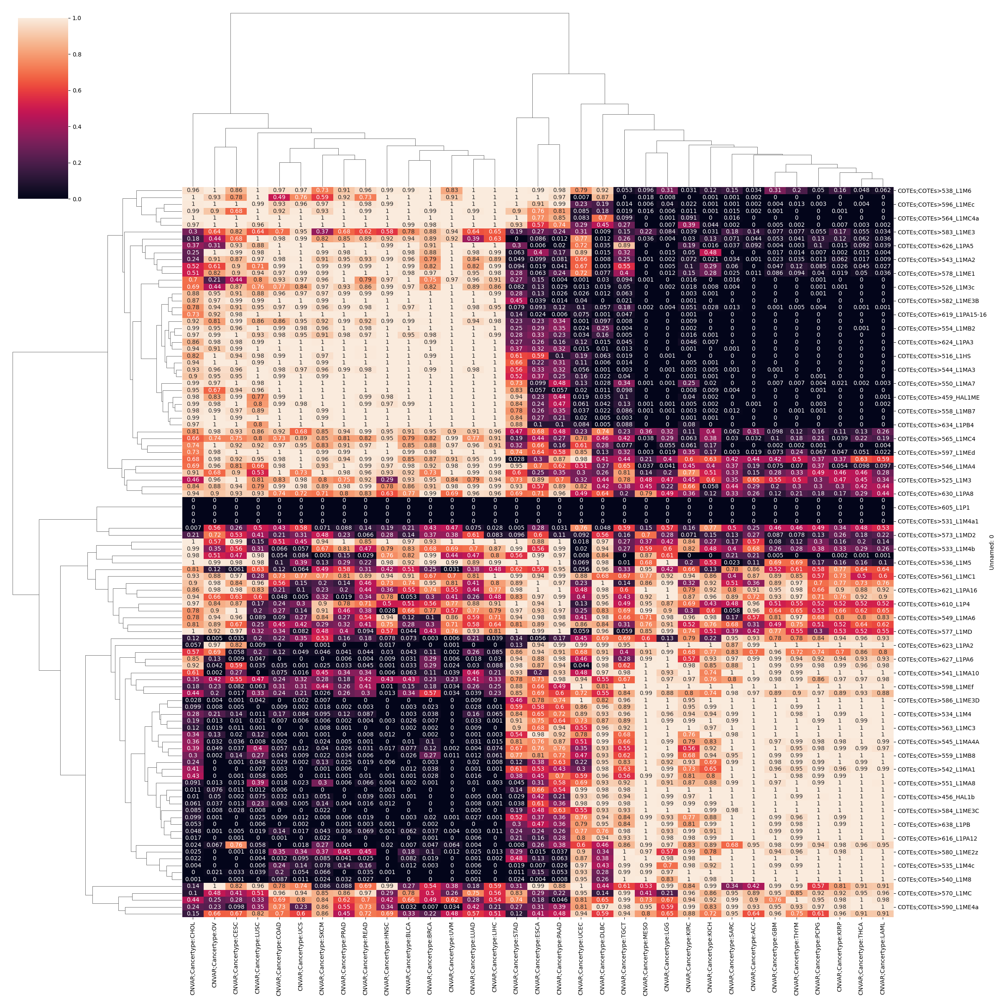

In [203]:
df = metric_visualization(pvalues['spearman_correlation'])

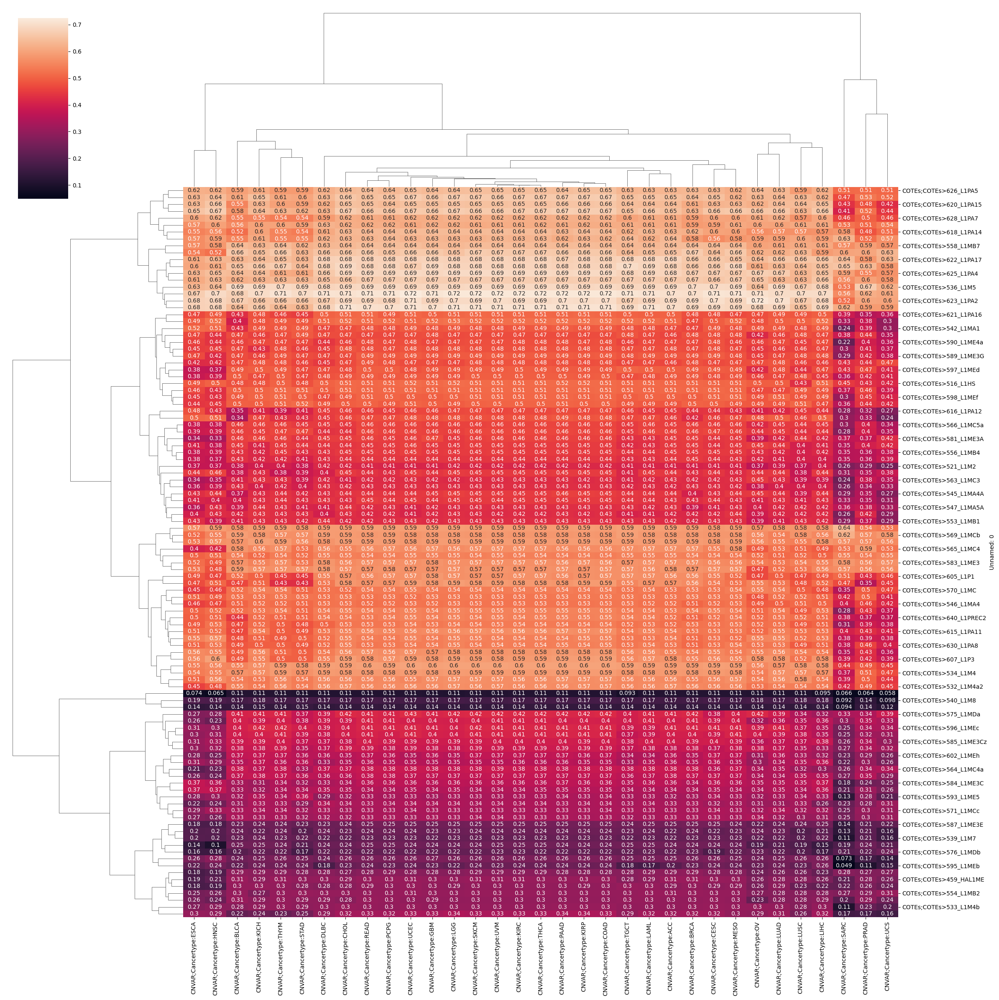

In [92]:
df

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:HNSC,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
COTEs;COTEs>86_AluJb,0.404011,0.365138,0.367523,0.378452,0.381679,0.407594,0.404652,0.402363,0.296431,0.404427,...,0.345090,0.405556,0.404114,0.403301,0.388382,0.395087,0.361717,0.412491,0.406050,0.406780
COTEs;COTEs>863_LTR85c,0.169190,0.129977,0.170746,0.177112,0.169208,0.169019,0.171420,0.171687,0.172273,0.171304,...,0.173261,0.171493,0.173914,0.169512,0.168076,0.173106,0.144296,0.170174,0.171567,0.171174
COTEs;COTEs>862_LTR85b,0.198271,0.104923,0.145171,0.189650,0.199355,0.195843,0.202212,0.203021,0.083426,0.195629,...,0.064587,0.203091,0.205075,0.196845,0.185046,0.200567,0.175972,0.200391,0.203200,0.201826
COTEs;COTEs>860_LTR84b,0.415110,0.458670,0.470851,0.482714,0.421854,0.420328,0.416798,0.416442,0.499843,0.426667,...,0.486302,0.416740,0.422442,0.420500,0.405882,0.429322,0.352944,0.413479,0.417217,0.417893
COTEs;COTEs>856_LTR82A,0.442293,0.313199,0.400458,0.431657,0.438056,0.436651,0.450899,0.452814,0.355256,0.439618,...,0.270755,0.447726,0.442507,0.437104,0.436866,0.446371,0.384455,0.442867,0.448039,0.445384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COTEs;COTEs>632_L1PB2,0.520396,0.477657,0.497878,0.501072,0.380333,0.506245,0.399590,0.519081,0.492767,0.523676,...,0.524816,0.516802,0.513754,0.525110,0.512438,0.481851,0.301994,0.508461,0.516045,0.519219
COTEs;COTEs>636_L1PBa,0.532890,0.520327,0.526137,0.492805,0.391087,0.539418,0.471969,0.524549,0.494936,0.537009,...,0.525813,0.531408,0.529919,0.537609,0.504812,0.518395,0.375431,0.518842,0.530111,0.534899
COTEs;COTEs>642_L2-3_Crp,0.477658,0.477879,0.468079,0.481098,0.474205,0.479816,0.494834,0.480294,0.455678,0.479448,...,0.464698,0.479447,0.481194,0.478225,0.479019,0.490534,0.430817,0.469900,0.479009,0.479427


In [75]:
cosine_score = pd.concat(scores['cosine_sim']['chrX'])

In [74]:
pd.concat(scores['cosine_sim']['chrX'])

,Unnamed: 0,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,...,CNVAR;Cancertype:HNSC,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM
0,COTEs;COTEs>86_AluJb,0.404011,0.365138,0.367523,0.378452,0.381679,0.407594,0.404652,0.402363,0.296431,...,0.345090,0.405556,0.404114,0.403301,0.388382,0.395087,0.361717,0.412491,0.406050,0.406780
1,COTEs;COTEs>863_LTR85c,0.169190,0.129977,0.170746,0.177112,0.169208,0.169019,0.171420,0.171687,0.172273,...,0.173261,0.171493,0.173914,0.169512,0.168076,0.173106,0.144296,0.170174,0.171567,0.171174
2,COTEs;COTEs>862_LTR85b,0.198271,0.104923,0.145171,0.189650,0.199355,0.195843,0.202212,0.203021,0.083426,...,0.064587,0.203091,0.205075,0.196845,0.185046,0.200567,0.175972,0.200391,0.203200,0.201826
3,COTEs;COTEs>860_LTR84b,0.415110,0.458670,0.470851,0.482714,0.421854,0.420328,0.416798,0.416442,0.499843,...,0.486302,0.416740,0.422442,0.420500,0.405882,0.429322,0.352944,0.413479,0.417217,0.417893
4,COTEs;COTEs>856_LTR82A,0.442293,0.313199,0.400458,0.431657,0.438056,0.436651,0.450899,0.452814,0.355256,...,0.270755,0.447726,0.442507,0.437104,0.436866,0.446371,0.384455,0.442867,0.448039,0.445384
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5,COTEs;COTEs>632_L1PB2,0.520396,0.477657,0.497878,0.501072,0.380333,0.506245,0.399590,0.519081,0.492767,...,0.524816,0.516802,0.513754,0.525110,0.512438,0.481851,0.301994,0.508461,0.516045,0.519219
6,COTEs;COTEs>636_L1PBa,0.532890,0.520327,0.526137,0.492805,0.391087,0.539418,0.471969,0.524549,0.494936,...,0.525813,0.531408,0.529919,0.537609,0.504812,0.518395,0.375431,0.518842,0.530111,0.534899
7,COTEs;COTEs>642_L2-3_Crp,0.477658,0.477879,0.468079,0.481098,0.474205,0.479816,0.494834,0.480294,0.455678,...,0.464698,0.479447,0.481194,0.478225,0.479019,0.490534,0.430817,0.469900,0.479009,0.479427
8,COTEs;COTEs>634_L1PB4,0.689041,0.612473,0.634643,0.637932,0.634401,0.668204,0.654284,0.696366,0.603726,...,0.611793,0.685402,0.677590,0.683451,0.676766,0.663967,0.579890,0.675505,0.684459,0.684943


In [35]:
chr1_scores = pd.concat(scores['cosine_sim']['chr1']).dropna()
chr1_scores = chr1_scores.set_index('Unnamed: 0')

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


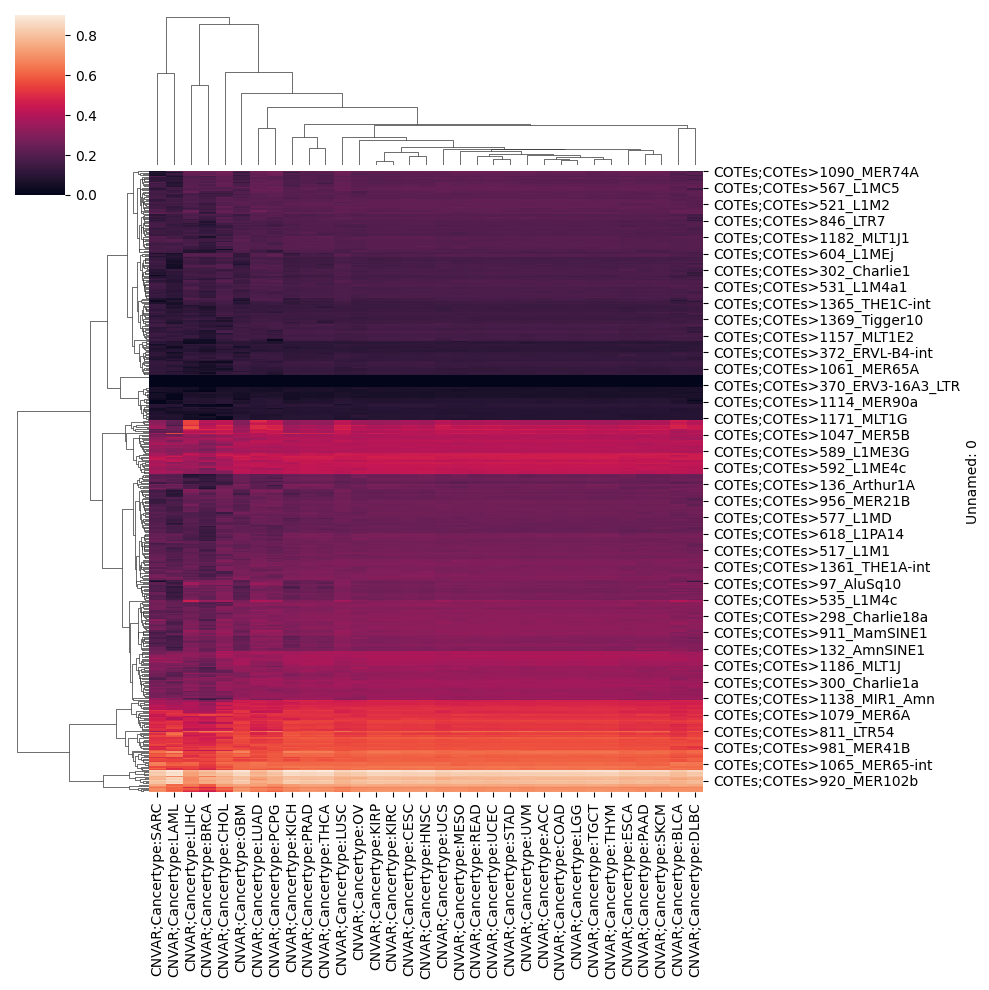

In [37]:
cl1 = sns.clustermap(ch1_scores)

In [39]:
row_order = cl1.dendrogram_row.reordered_ind
col_order = cl1.dendrogram_col.reordered_ind

In [40]:
chr1_scores = chr1_scores.iloc[row_order, col_order]

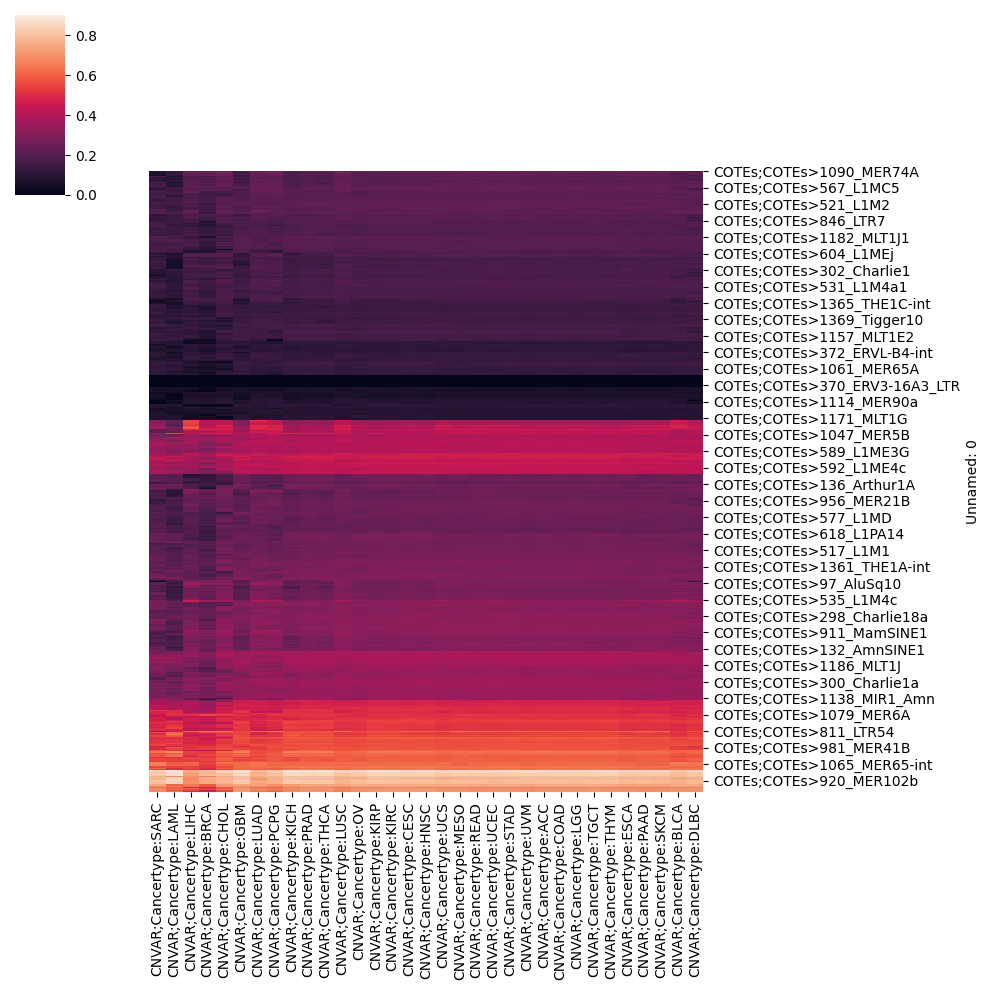

In [42]:
cl1 = sns.clustermap(chr1_scores, row_cluster=False, col_cluster=False)

In [6]:
ch1_pvals = pd.concat(pvalues['spearman_correlation']['chr1']).dropna()
ch1_pvals = ch1_pvals.set_index('Unnamed: 0')

In [ ]:
chr1_pvals = pd.concat(pvalues['cosine_sim']['chr1']).dropna()
chr1_pvals = chr1_pvals.set_index('Unnamed: 0')

In [46]:
chr1_pvals = chr1_pvals.iloc[row_order, col_order]

In [289]:
z.shape

(2, 2)

In [294]:
np.cumsum(pca.explained_variance_)

array([163.813571, 163.813571])

In [292]:
z.shape

(2, 2)

In [290]:
pca = PCA()
z = pca.fit_transform(l2)

In [287]:
l2.values.shape

(2, 759)

In [296]:
def apply_pca(df, variance_threshold=0.99):
    """
    Apply PCA on a dataframe and retain columns that account for the given variance threshold.
    
    Parameters:
    - df (pd.DataFrame): Input dataframe
    - variance_threshold (float, optional): Desired explained variance threshold. Default is 0.99.
    
    Returns:
    - pd.DataFrame: Transformed dataframe after applying PCA
    """
    
    # Initialize PCA
    pca = PCA(n_components=variance_threshold)
    
    # Fit and transform the data
    transformed_data = pca.fit_transform(df)
    
    # Convert the transformed data into a DataFrame
    transformed_df = pd.DataFrame(transformed_data, columns=[f'PC{i+1}' for i in range(transformed_data.shape[1])])
    
    return transformed_df


In [357]:
l2

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM,class
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
COTEs;COTEs>86_AluJb,0.114,0.070,0.299,1.000,0.208,0.868,0.009,0.339,0.104,1.000,...,0.421,0.958,0.985,0.746,0.860,0.140,0.003,0.223,0.056,11
COTEs;COTEs>863_LTR85c,1.000,1.000,0.000,0.000,1.000,0.000,0.968,1.000,0.000,0.000,...,1.000,0.043,0.244,0.868,0.000,0.998,1.000,1.000,1.000,22
COTEs;COTEs>862_LTR85b,1.000,0.680,0.000,0.000,1.000,0.001,0.211,1.000,0.021,0.004,...,0.998,0.002,0.582,1.000,0.000,0.983,1.000,0.987,1.000,9
COTEs;COTEs>860_LTR84b,1.000,0.773,0.000,0.000,1.000,0.000,0.165,1.000,0.002,0.000,...,1.000,0.086,0.388,0.893,0.000,0.997,1.000,1.000,1.000,1
COTEs;COTEs>856_LTR82A,1.000,0.873,0.000,0.000,1.000,0.000,0.128,1.000,0.003,0.000,...,0.274,0.579,1.000,0.207,0.000,0.573,0.999,0.070,0.985,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COTEs;COTEs>632_L1PB2,0.986,0.659,0.457,0.435,0.970,0.275,0.994,0.995,0.282,0.336,...,0.464,0.142,0.057,0.053,0.927,0.891,0.126,0.096,0.566,31
COTEs;COTEs>636_L1PBa,0.024,0.828,1.000,0.920,0.000,0.996,0.958,0.956,1.000,0.849,...,0.011,0.600,0.863,0.294,0.998,0.016,0.007,0.183,0.004,2
COTEs;COTEs>642_L2-3_Crp,0.000,0.779,1.000,1.000,0.000,1.000,0.972,0.111,0.999,1.000,...,0.000,0.009,1.000,0.003,0.452,0.000,0.000,0.000,0.000,3


In [359]:
apply_pca(l2)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC202,PC203,PC204,PC205,PC206,PC207,PC208,PC209,PC210,PC211
0,-2.739527,0.775026,9.945539,0.598911,-0.165486,4.217977,0.060897,-1.424246,-0.088884,-1.672737,...,-0.088244,0.269425,0.136040,-0.206171,0.094999,-0.084725,-0.048466,0.400437,0.142089,-0.102179
1,8.469880,6.933065,-2.139783,0.176637,0.039775,-1.939784,1.707594,0.797970,-0.718703,-0.508079,...,-0.007533,-0.194004,-0.279264,-0.042328,0.002293,-0.070266,-0.081783,0.189881,-0.012895,0.082730
2,-4.603827,6.433868,-2.578737,0.565728,1.809991,1.097189,0.135222,1.580226,-1.959297,2.287985,...,0.215420,0.033257,0.112709,0.003530,0.159464,-0.061182,0.004610,0.135646,-0.146581,0.336683
3,-12.728302,3.082596,-1.738526,-0.721501,1.725170,0.588951,-0.957762,3.513946,-0.333145,1.006749,...,0.080920,0.152605,0.228721,-0.202910,0.100674,0.154971,-0.180977,0.032802,0.119882,-0.336920
4,8.480120,6.633140,-2.117412,-0.668464,0.490366,-2.184125,1.114564,0.329649,-0.946186,-0.289780,...,-0.201379,-0.121788,-0.164223,0.058974,0.214521,-0.009328,0.196025,0.305263,-0.126592,-0.035573
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
448,17.338851,-1.110442,-0.192306,-0.525018,-0.735137,0.238632,-1.138921,0.840232,0.560331,0.919825,...,0.091590,-0.115026,-0.078172,0.008381,0.115677,-0.026740,0.076080,0.136495,-0.306828,0.440881
449,-11.788582,-3.085683,-1.351173,-0.748255,0.120396,0.970195,-0.607923,0.852388,1.013050,-3.222811,...,-0.075707,0.216714,0.000700,-0.083748,0.209906,-0.228021,0.277887,0.322286,0.075487,0.165996
450,-10.722430,-7.130635,-1.716131,0.854806,-0.143893,1.752617,0.060434,1.415100,0.091867,-0.958028,...,-0.096964,-0.192612,-0.143992,0.025639,-0.099434,0.128890,-0.000338,0.170755,-0.103984,0.001547
451,-10.863767,-8.325351,-0.774477,0.119106,-0.394453,1.379887,-1.011576,-0.165660,-0.939887,-0.114174,...,-0.046470,-0.008735,-0.059918,0.135213,-0.131664,-0.006540,0.183359,-0.039097,0.044361,0.006986


In [362]:
l2.shape

(453, 759)

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


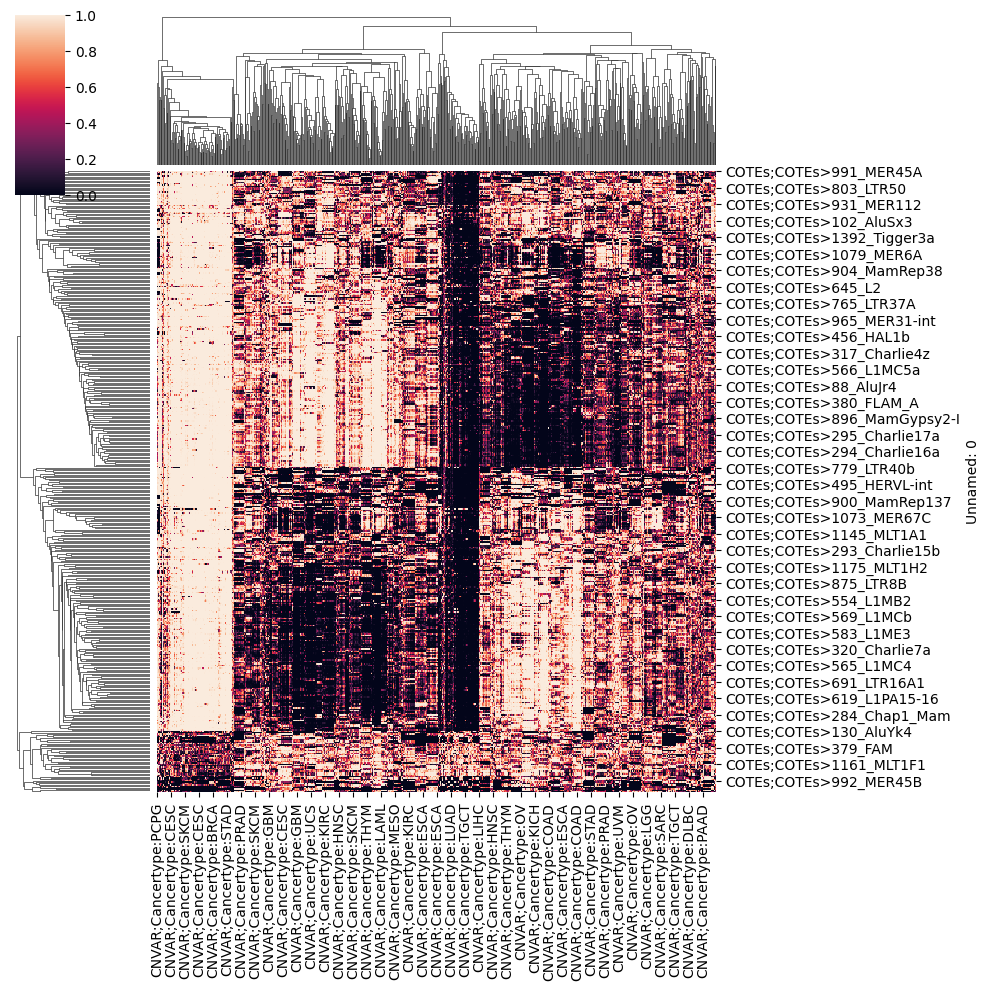

In [361]:
sns.clustermap(l2)

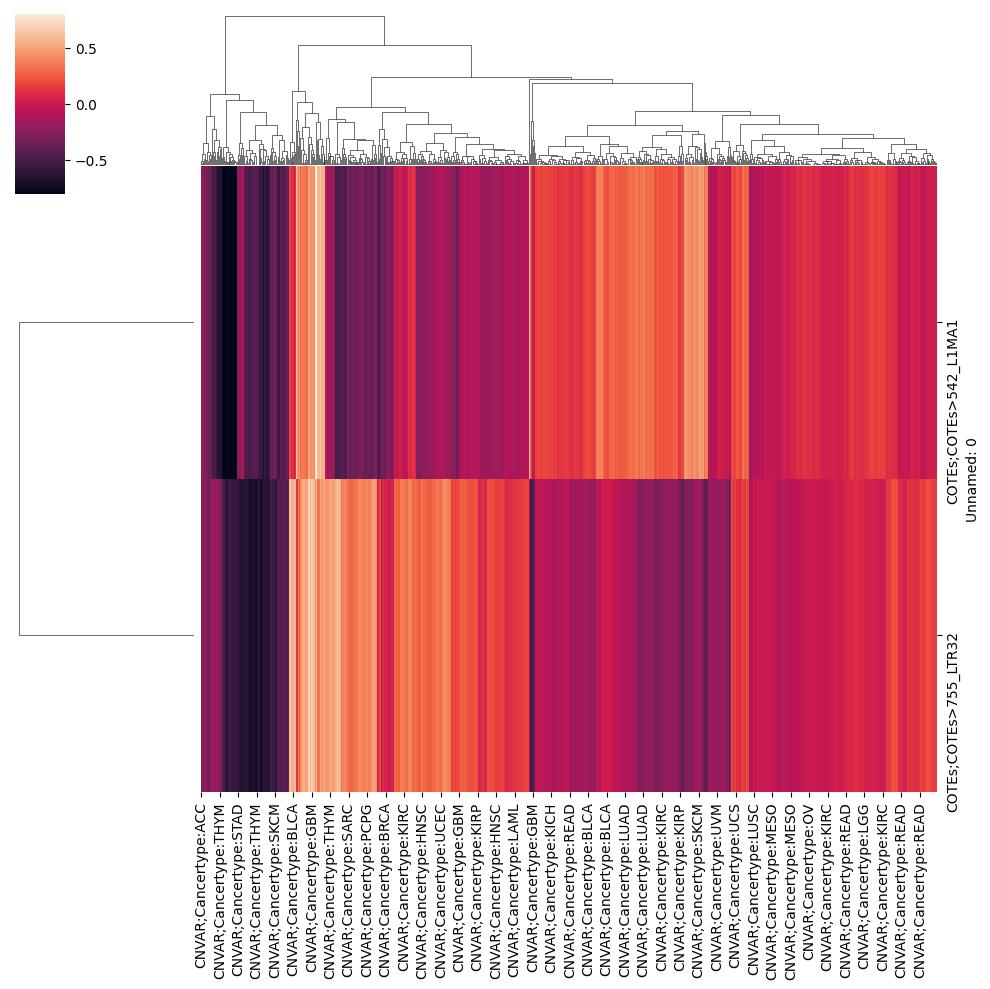

In [282]:
sns.clustermap(l1.fillna(0))

In [360]:
l2 = pd.concat([pd.concat(pvalues['spearman_correlation'][chr]).set_index('Unnamed: 0') for chr in ca.info.CHROMOSOMES['names'][:-1]], axis=1)

In [380]:
te_df[te_df['repname_numbered'].apply(lambda x: x in ss.loc[ss['class']==1]['index'].apply(lambda x:x.split('COTEs;COTEs>')[-1]).values)]['Superfamily'].count_values()

AttributeError: 'Series' object has no attribute 'count_values'

3             860_LTR84b
12          321_Charlie7
23        299_Charlie19a
74            765_LTR37A
83            957_MER21C
125             521_L1M2
135            456_HAL1b
145           547_L1MA5A
155       1376_Tigger15a
165          1173_MLT1H1
207        1210_MSTA-int
209            1214_MSTB
217    1391_Tigger2b_Pri
226           1149_MLT1B
246          913_MamTip2
255           1362_THE1B
256       1365_THE1C-int
266            627_L1PA6
306               645_L2
315             846_LTR7
335         904_MamRep38
385             539_L1M7
395           1205_MLT2F
405             607_L1P3
Name: index, dtype: object

In [370]:
ss = pd.DataFrame({'class':classes, 'index':l2.index})

In [364]:
453//33

13

In [363]:
l2.shape\

(453, 759)

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

<AxesSubplot: ylabel='Unnamed: 0'>

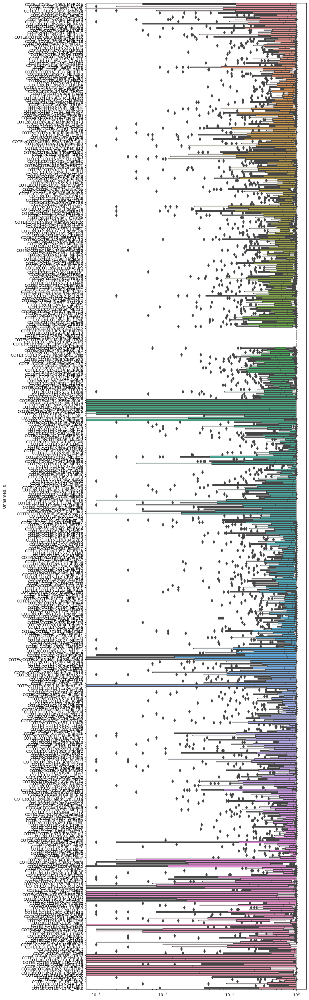

In [237]:
plt.figure(figsize=(10, 45))
plt.xscale('log')
sns.boxenplot(chr1_pvals.T, orient='h')

In [323]:
classes.shape

(453,)

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM,class
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
COTEs;COTEs>86_AluJb,0.114,0.070,0.299,1.000,0.208,0.868,0.009,0.339,0.104,1.000,...,0.421,0.958,0.985,0.746,0.860,0.140,0.003,0.223,0.056,11
COTEs;COTEs>863_LTR85c,1.000,1.000,0.000,0.000,1.000,0.000,0.968,1.000,0.000,0.000,...,1.000,0.043,0.244,0.868,0.000,0.998,1.000,1.000,1.000,22
COTEs;COTEs>862_LTR85b,1.000,0.680,0.000,0.000,1.000,0.001,0.211,1.000,0.021,0.004,...,0.998,0.002,0.582,1.000,0.000,0.983,1.000,0.987,1.000,9
COTEs;COTEs>860_LTR84b,1.000,0.773,0.000,0.000,1.000,0.000,0.165,1.000,0.002,0.000,...,1.000,0.086,0.388,0.893,0.000,0.997,1.000,1.000,1.000,1
COTEs;COTEs>856_LTR82A,1.000,0.873,0.000,0.000,1.000,0.000,0.128,1.000,0.003,0.000,...,0.274,0.579,1.000,0.207,0.000,0.573,0.999,0.070,0.985,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COTEs;COTEs>632_L1PB2,0.986,0.659,0.457,0.435,0.970,0.275,0.994,0.995,0.282,0.336,...,0.464,0.142,0.057,0.053,0.927,0.891,0.126,0.096,0.566,31
COTEs;COTEs>636_L1PBa,0.024,0.828,1.000,0.920,0.000,0.996,0.958,0.956,1.000,0.849,...,0.011,0.600,0.863,0.294,0.998,0.016,0.007,0.183,0.004,2
COTEs;COTEs>642_L2-3_Crp,0.000,0.779,1.000,1.000,0.000,1.000,0.972,0.111,0.999,1.000,...,0.000,0.009,1.000,0.003,0.452,0.000,0.000,0.000,0.000,3


In [329]:
l2

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM,class
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
COTEs;COTEs>86_AluJb,0.114,0.070,0.299,1.000,0.208,0.868,0.009,0.339,0.104,1.000,...,0.421,0.958,0.985,0.746,0.860,0.140,0.003,0.223,0.056,11
COTEs;COTEs>863_LTR85c,1.000,1.000,0.000,0.000,1.000,0.000,0.968,1.000,0.000,0.000,...,1.000,0.043,0.244,0.868,0.000,0.998,1.000,1.000,1.000,22
COTEs;COTEs>862_LTR85b,1.000,0.680,0.000,0.000,1.000,0.001,0.211,1.000,0.021,0.004,...,0.998,0.002,0.582,1.000,0.000,0.983,1.000,0.987,1.000,9
COTEs;COTEs>860_LTR84b,1.000,0.773,0.000,0.000,1.000,0.000,0.165,1.000,0.002,0.000,...,1.000,0.086,0.388,0.893,0.000,0.997,1.000,1.000,1.000,1
COTEs;COTEs>856_LTR82A,1.000,0.873,0.000,0.000,1.000,0.000,0.128,1.000,0.003,0.000,...,0.274,0.579,1.000,0.207,0.000,0.573,0.999,0.070,0.985,22
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COTEs;COTEs>632_L1PB2,0.986,0.659,0.457,0.435,0.970,0.275,0.994,0.995,0.282,0.336,...,0.464,0.142,0.057,0.053,0.927,0.891,0.126,0.096,0.566,31
COTEs;COTEs>636_L1PBa,0.024,0.828,1.000,0.920,0.000,0.996,0.958,0.956,1.000,0.849,...,0.011,0.600,0.863,0.294,0.998,0.016,0.007,0.183,0.004,2
COTEs;COTEs>642_L2-3_Crp,0.000,0.779,1.000,1.000,0.000,1.000,0.972,0.111,0.999,1.000,...,0.000,0.009,1.000,0.003,0.452,0.000,0.000,0.000,0.000,3


In [330]:
dm = l2.groupby('class').mean()

In [331]:
np.argmax

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:HNSC,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM
class,,,,,,,,,,,,,,,,,,,,,
0,0.563000,0.430250,0.900000,0.898000,0.723500,0.672000,0.748000,0.672500,0.679250,0.859000,...,0.994500,0.265500,0.659000,0.975500,0.454000,0.705250,0.326500,0.118250,0.107000,0.231000
1,0.893875,0.422792,0.247875,0.290875,0.876125,0.246792,0.252792,0.760208,0.258667,0.255875,...,0.118500,0.918542,0.308708,0.609417,0.789292,0.118750,0.927750,0.940208,0.825833,0.946917
2,0.131316,0.415895,0.909842,0.917211,0.156421,0.942684,0.601263,0.241158,0.841053,0.824737,...,0.983316,0.006947,0.827053,0.221368,0.130842,0.916789,0.025368,0.011526,0.034105,0.004105
3,0.002479,0.629104,0.998667,0.979167,0.000854,0.991417,0.829813,0.015188,0.966646,0.964500,...,0.988042,0.018562,0.847125,0.348646,0.078979,0.983896,0.021625,0.007375,0.051167,0.008792
4,0.551000,0.631500,0.539000,0.749500,0.499250,0.719000,0.534750,0.637250,0.337000,0.750000,...,0.491500,0.671250,0.492250,0.820500,0.931500,0.346000,0.733750,0.764500,0.549000,0.805500
5,0.976812,0.324437,0.022250,0.040500,0.981281,0.010250,0.139844,0.981844,0.035687,0.092188,...,0.038625,0.995719,0.223594,0.703531,0.950156,0.043437,0.995812,0.988844,0.972219,0.999656
6,0.406556,0.417222,0.220000,0.365333,0.671889,0.576444,0.019333,0.249222,0.465111,0.748333,...,0.761333,0.086333,0.720667,0.111000,0.136333,0.793778,0.120000,0.105111,0.344667,0.033111
7,0.131231,0.491154,0.996923,0.748000,0.005077,0.596000,0.997308,0.499077,0.909154,0.023538,...,0.156308,0.935923,0.104154,0.835385,0.635231,0.083154,0.886385,0.912308,0.712692,0.994462
8,0.791500,0.046500,0.795000,0.683500,0.993500,0.487000,0.671000,0.929500,0.264500,0.776500,...,0.598000,0.417500,0.797000,0.515500,0.110500,0.780000,0.315000,0.462000,0.245500,0.372500


In [319]:
l2['class'] = classes

In [ ]:
pvalues.keys()

In [332]:
scores.keys()

dict_keys(['cosine_sim', 'spearman_correlation', 'correlation_coefficient'])

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


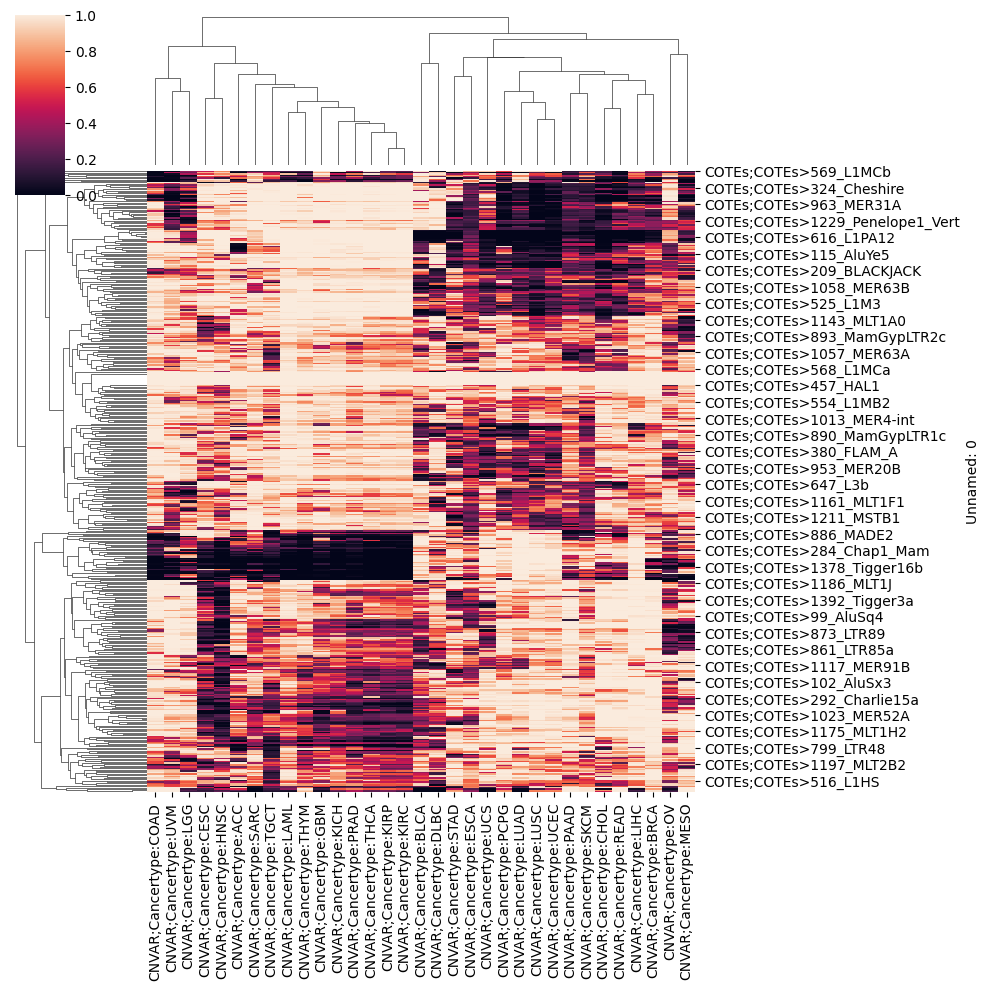

In [234]:
sns.clustermap(chr1_pvals)

In [48]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)  # Reduce to 2 components for visualization
pca_result = pca.fit_transform(chr1_scores)

In [231]:
v = df.groupby('class').mean().T.values

In [355]:
df

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM,class
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
COTEs;COTEs>562_L1MC2,0.098,0.984,0.910,0.864,0.935,0.230,0.907,0.234,0.676,0.483,...,0.256,0.991,0.315,0.737,0.398,0.680,0.314,0.164,0.901,1
COTEs;COTEs>566_L1MC5a,0.998,0.013,0.033,0.021,0.002,0.732,0.026,0.886,0.754,0.636,...,0.997,0.004,0.995,0.873,0.996,0.006,1.000,0.995,0.000,0
COTEs;COTEs>563_L1MC3,0.998,0.019,0.009,0.001,0.001,0.551,0.002,0.924,0.677,0.936,...,1.000,0.000,0.999,0.961,0.968,0.000,1.000,1.000,0.000,0
COTEs;COTEs>567_L1MC5,1.000,0.021,0.002,0.039,0.000,0.928,0.000,0.995,0.150,0.053,...,1.000,0.035,0.966,0.279,1.000,0.054,0.997,0.998,0.000,0
COTEs;COTEs>570_L1MC,0.947,0.476,0.749,0.514,0.864,0.952,0.779,0.989,0.286,0.222,...,0.963,0.968,0.206,0.141,0.865,0.939,0.887,0.924,0.256,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COTEs;COTEs>630_L1PA8,0.117,0.900,0.964,0.931,0.800,0.487,0.773,0.197,0.707,0.957,...,0.438,0.835,0.494,0.638,0.118,0.721,0.259,0.178,0.687,1
COTEs;COTEs>632_L1PB2,0.276,0.680,0.993,0.530,0.984,0.298,0.920,0.807,0.252,0.348,...,0.283,0.963,0.199,0.255,0.514,0.731,0.149,0.488,0.997,1
COTEs;COTEs>636_L1PBa,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0


In [354]:
f[f['class']==1]

,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,CNVAR;Cancertype:PAAD,...,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM,class
Unnamed: 0,,,,,,,,,,,,,,,,,,,,,
COTEs;COTEs>860_LTR84b,0.698,0.152,0.761,0.686,0.637,0.850,0.094,0.771,0.834,0.948,...,0.888,0.736,0.975,0.519,0.656,0.568,0.669,0.998,0.992,1
COTEs;COTEs>321_Charlie7,0.854,0.744,0.980,0.971,0.409,0.995,0.385,0.037,0.861,0.970,...,0.980,0.857,0.982,0.155,0.819,0.495,0.958,1.000,0.882,1
COTEs;COTEs>299_Charlie19a,0.571,0.343,0.823,0.913,0.232,0.778,0.892,0.353,0.996,1.000,...,0.896,0.864,0.905,0.710,0.849,0.494,0.711,0.971,0.969,1
COTEs;COTEs>765_LTR37A,1.000,0.838,0.182,0.012,1.000,0.000,0.987,1.000,0.121,0.130,...,0.980,0.077,0.207,1.000,0.987,0.617,0.865,0.009,0.002,1
COTEs;COTEs>957_MER21C,0.996,0.837,0.267,0.202,0.990,0.083,0.935,1.000,0.206,0.419,...,0.979,0.956,0.715,1.000,0.995,0.850,0.982,0.282,0.297,1
COTEs;COTEs>521_L1M2,0.744,0.367,0.762,0.919,0.632,0.738,0.798,0.524,0.927,0.993,...,0.992,0.799,0.980,0.993,0.764,0.805,0.936,0.988,0.944,1
COTEs;COTEs>456_HAL1b,0.418,0.078,1.000,0.996,0.359,0.925,0.273,0.467,0.491,0.999,...,0.757,0.960,1.000,0.604,0.670,0.223,0.998,1.000,1.000,1
COTEs;COTEs>547_L1MA5A,0.998,0.662,0.213,0.000,1.000,0.000,0.938,1.000,0.126,0.191,...,1.000,0.109,0.395,1.000,0.995,0.469,0.997,0.036,0.200,1
COTEs;COTEs>1376_Tigger15a,0.288,0.893,0.984,0.990,0.388,0.884,0.445,0.397,0.632,0.969,...,0.928,0.999,0.930,0.896,0.400,0.973,0.942,0.983,0.953,1


In [348]:
np.argmin(ff, axis=0)

array([25,  3, 14, 24, 25, 24, 22, 30, 24, 24, 18, 14, 30, 30, 24, 18,  8,
       18, 24, 24, 24, 25, 30, 30, 18, 14, 24, 12, 18, 22, 18, 24, 24])

In [344]:
ff =f.groupby('class').mean()

In [339]:
f['class'] = classes

In [338]:
f = pd.concat(pvalues['cosine_sim']['chr1']).set_index('Unnamed: 0')

In [60]:
import umap

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/cluster/home/t124771uhn/miniconda3/envs/shiri

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

<AxesSubplot: xlabel='Unnamed: 0'>

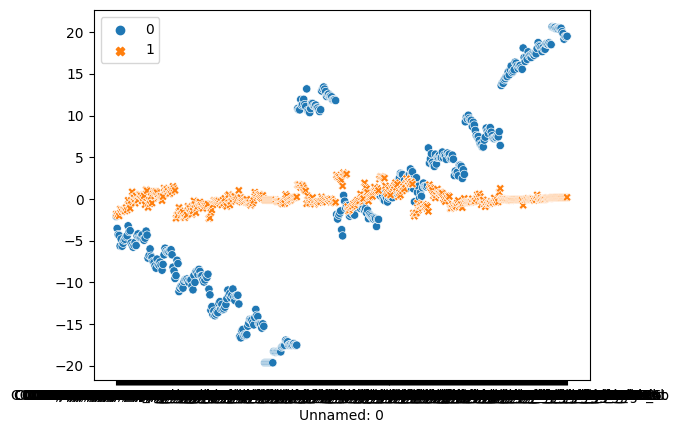

In [204]:
sns.scatterplot(pd.DataFrame(tsne_result, index=chr1_scores.index))

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

<AxesSubplot: xlabel='Unnamed: 0'>

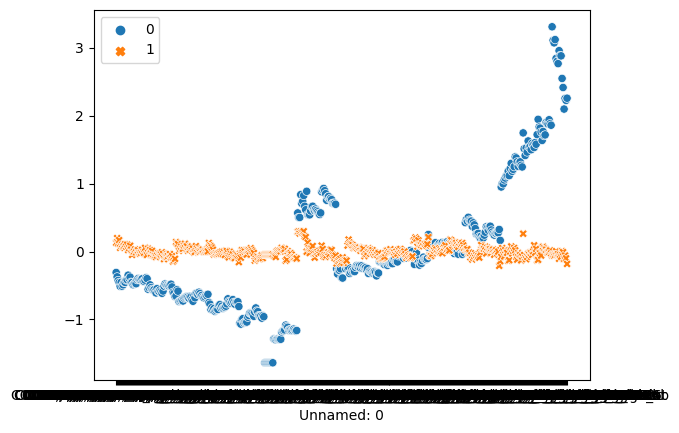

In [56]:
sns.scatterplot(pd.DataFrame(pca_result, index=chr1_scores.index))

In [173]:
umap_results = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2).fit_transform(df)

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_d

<AxesSubplot: >

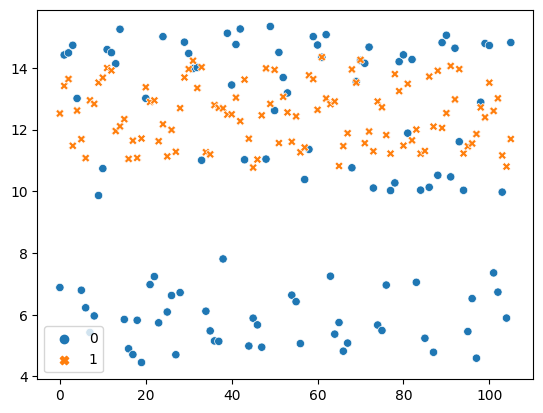

In [176]:
sns.scatterplot(pd.DataFrame(umap_results))

In [311]:
import umap
import numpy as np
import matplotlib.pyplot as plt
reducer = umap.UMAP(random_state=42)

In [312]:
embedding = reducer.fit_transform(l2)

In [217]:
v = df.groupby('class').mean()

In [210]:
df['class'] = colors

In [181]:
from sklearn.cluster import KMeans

def kmeans_clustering(embeddings, n_clusters):
    """
    Perform k-means clustering on the embeddings and assign cluster labels.

    Parameters:
    - embeddings: The data points (e.g., UMAP embeddings).
    - n_clusters: Number of clusters to form.

    Returns:
    - cluster_labels: Cluster label assigned to each data point.
    """
    # Initialize k-means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    
    # Fit the k-means clustering model and predict the cluster assignments
    cluster_labels = kmeans.fit_predict(embeddings)
    
    return cluster_labels

In [316]:
classes = kmeans_clustering(l2.values, 33)

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [324]:
classes.shape

(453,)

In [184]:
colors = kmeans_clustering(embedding, 2)

/cluster/home/t124771uhn/miniconda3/envs/shirin/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [189]:
colors

array([1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0], dtype=int32)

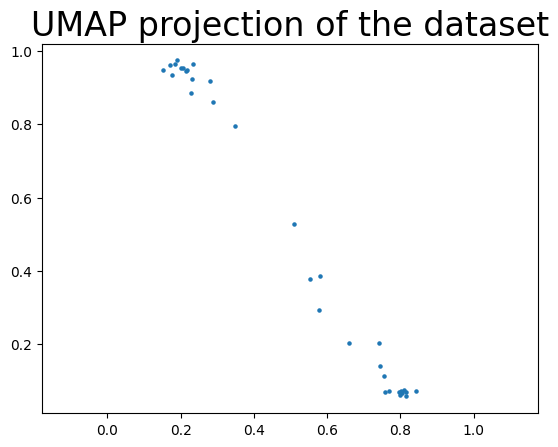

In [233]:
plt.scatter(v[:, 0], v[:, 1], s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the dataset', fontsize=24);
plt.show()

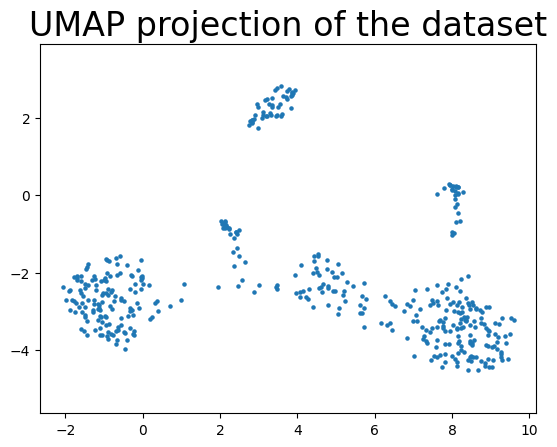

In [314]:
plt.scatter(embedding[:, 0], embedding[:, 1], s=5)
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the dataset', fontsize=24);
plt.show()

In [ ]:
df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]

In [57]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_result = tsne.fit_transform(chr1_scores)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 453 samples in 0.001s...
[t-SNE] Computed neighbors for 453 samples in 0.192s...
[t-SNE] Computed conditional probabilities for sample 453 / 453
[t-SNE] Mean sigma: 0.105357
[t-SNE] KL divergence after 250 iterations with early exaggeration: 46.234974
[t-SNE] KL divergence after 300 iterations: 0.286747


In [ ]:
df['t-SNE1'] = tsne_result[:, 0]
df['t-SNE2'] = tsne_result[:, 1]

In [224]:
ch1_scores = pd.concat(scores['cosine_sim']['chr1'])
ch1_scores = ch1_scores.set_index('Unnamed: 0')
sns.clustermap(ch1_scores, figsize=(24, 24))

,Unnamed: 0,CNVAR;Cancertype:GBM,CNVAR;Cancertype:OV,CNVAR;Cancertype:LUAD,CNVAR;Cancertype:LUSC,CNVAR;Cancertype:PRAD,CNVAR;Cancertype:UCEC,CNVAR;Cancertype:BLCA,CNVAR;Cancertype:TGCT,CNVAR;Cancertype:ESCA,...,CNVAR;Cancertype:HNSC,CNVAR;Cancertype:LAML,CNVAR;Cancertype:READ,CNVAR;Cancertype:LGG,CNVAR;Cancertype:DLBC,CNVAR;Cancertype:KICH,CNVAR;Cancertype:UCS,CNVAR;Cancertype:ACC,CNVAR;Cancertype:PCPG,CNVAR;Cancertype:UVM
0,COTEs;COTEs>86_AluJb,0.484668,0.482651,0.470663,0.473257,0.491741,0.487383,0.482753,0.489080,0.487927,...,0.500562,0.392621,0.476433,0.485381,0.486570,0.489205,0.488944,0.489794,0.461446,0.477207
1,COTEs;COTEs>863_LTR85c,0.174922,0.197600,0.232016,0.242103,0.197386,0.226749,0.182517,0.213696,0.225890,...,0.216345,0.147458,0.228508,0.225060,0.212209,0.189995,0.215408,0.219240,0.250163,0.232747
2,COTEs;COTEs>862_LTR85b,0.162682,0.162076,0.145126,0.152951,0.166876,0.161967,0.159872,0.166135,0.155004,...,0.171096,0.131375,0.160156,0.164135,0.165273,0.167179,0.165124,0.164244,0.140805,0.157798
3,COTEs;COTEs>860_LTR84b,0.102460,0.112542,0.099818,0.108385,0.106692,0.108670,0.115402,0.109184,0.104545,...,0.111146,0.073955,0.109796,0.107883,0.111035,0.105991,0.109556,0.110588,0.071805,0.104199
4,COTEs;COTEs>856_LTR82A,0.215867,0.238713,0.268628,0.262396,0.227491,0.251816,0.274015,0.244497,0.243365,...,0.239010,0.160022,0.251949,0.248866,0.256669,0.221289,0.248974,0.249154,0.248959,0.246938
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5,COTEs;COTEs>632_L1PB2,0.116129,0.148323,0.150146,0.159093,0.145086,0.157031,0.136782,0.150612,0.153781,...,0.155166,0.114548,0.155674,0.153853,0.142007,0.142339,0.150901,0.153070,0.153000,0.156668
6,COTEs;COTEs>636_L1PBa,0.091479,0.115560,0.076938,0.084615,0.093259,0.089543,0.088262,0.090038,0.083946,...,0.100198,0.081088,0.090301,0.086981,0.089192,0.090689,0.096149,0.086662,0.077036,0.083366
7,COTEs;COTEs>642_L2-3_Crp,0.255554,0.274504,0.246158,0.259697,0.276780,0.268435,0.268327,0.274067,0.269193,...,0.281528,0.213196,0.269323,0.266668,0.271929,0.270081,0.274406,0.271184,0.253207,0.259943
8,COTEs;COTEs>634_L1PB4,0.266623,0.296096,0.288213,0.304856,0.291730,0.299983,0.304834,0.297262,0.295205,...,0.296741,0.236278,0.302753,0.299825,0.301318,0.287395,0.297447,0.302313,0.299889,0.299135


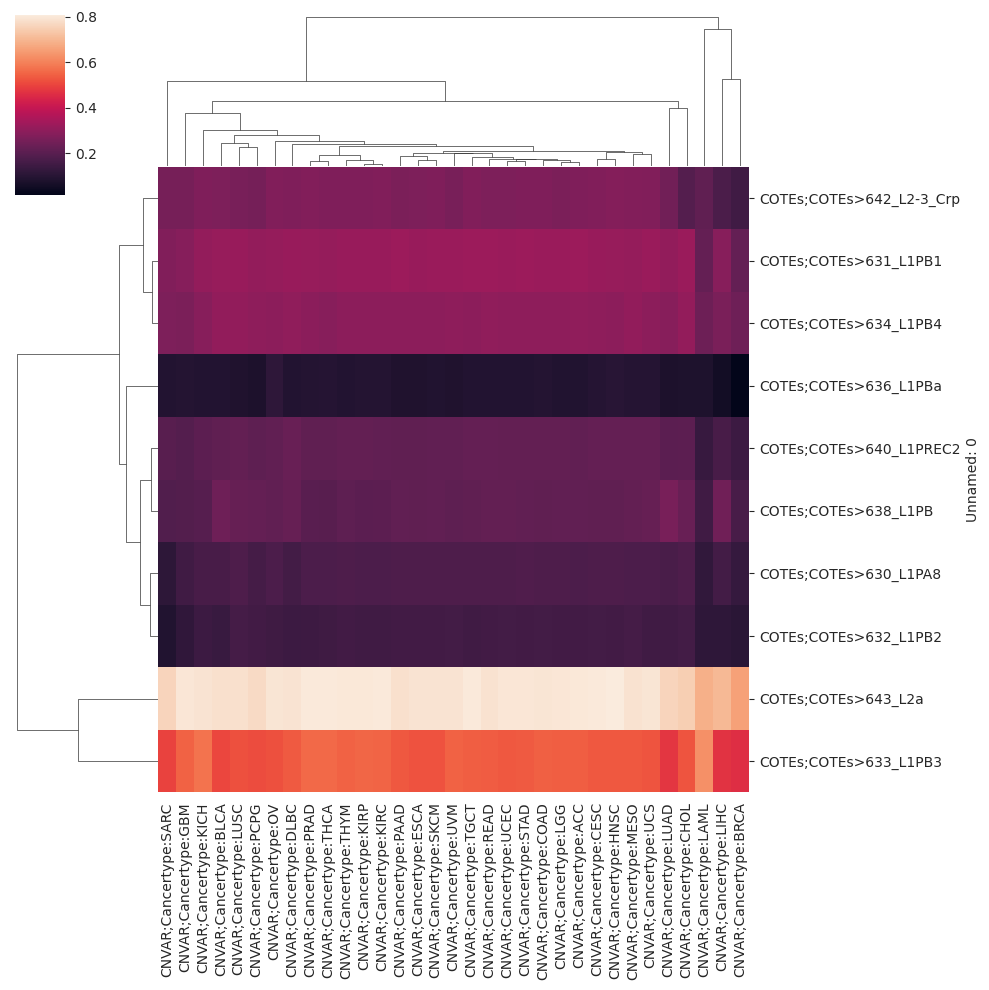

In [143]:
df = scores['cosine_sim']['chr1']
df = df.set_index('Unnamed: 0')
sns.clustermap(df)

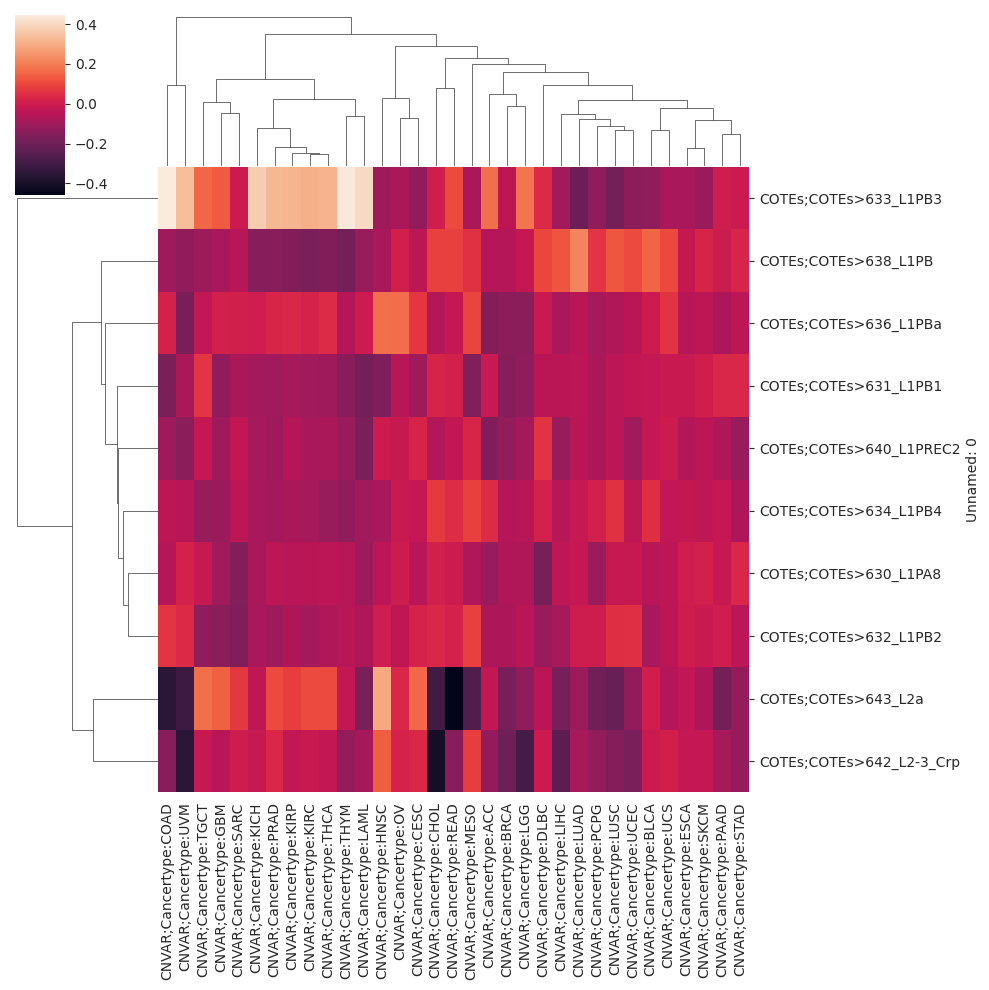

In [146]:
df = scores['correlation_coefficient']['chr1']
df = df.set_index('Unnamed: 0')
sns.clustermap(df)

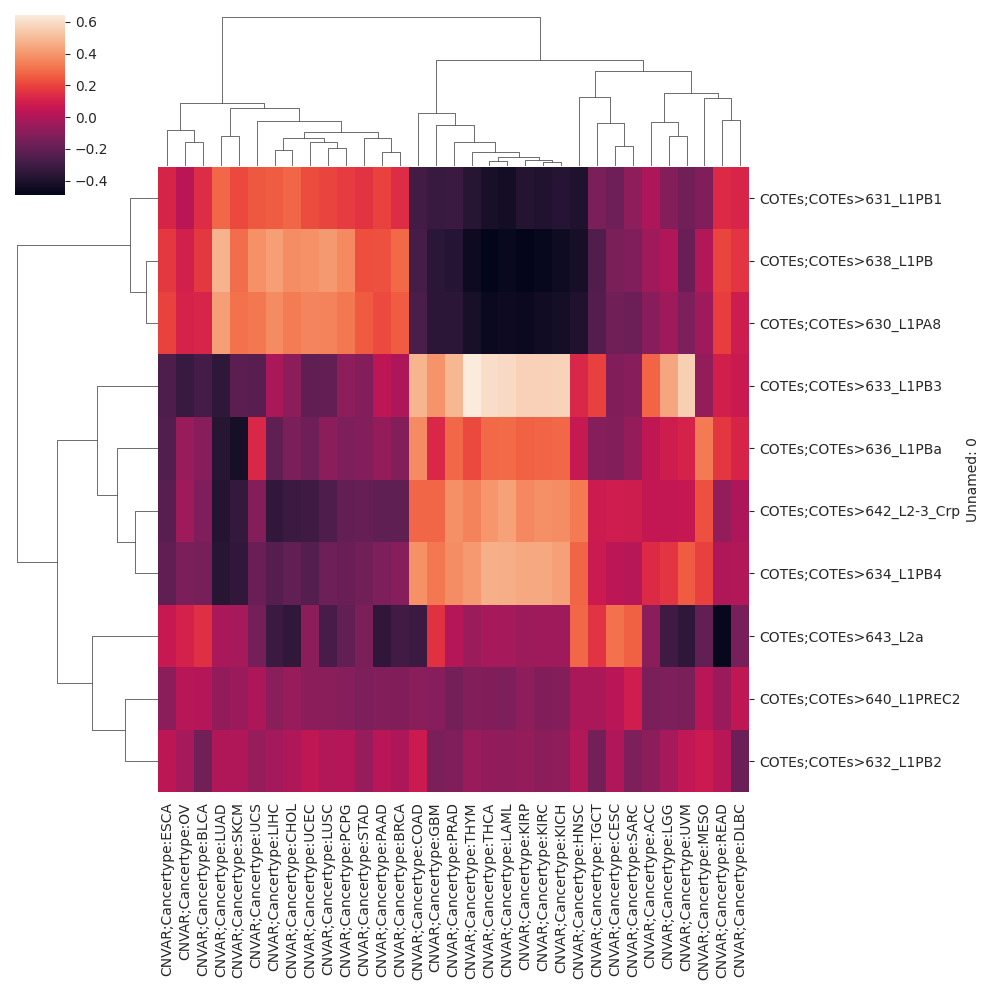

In [145]:
df = scores['spearman_correlation']['chr1']
df = df.set_index('Unnamed: 0')
sns.clustermap(df)

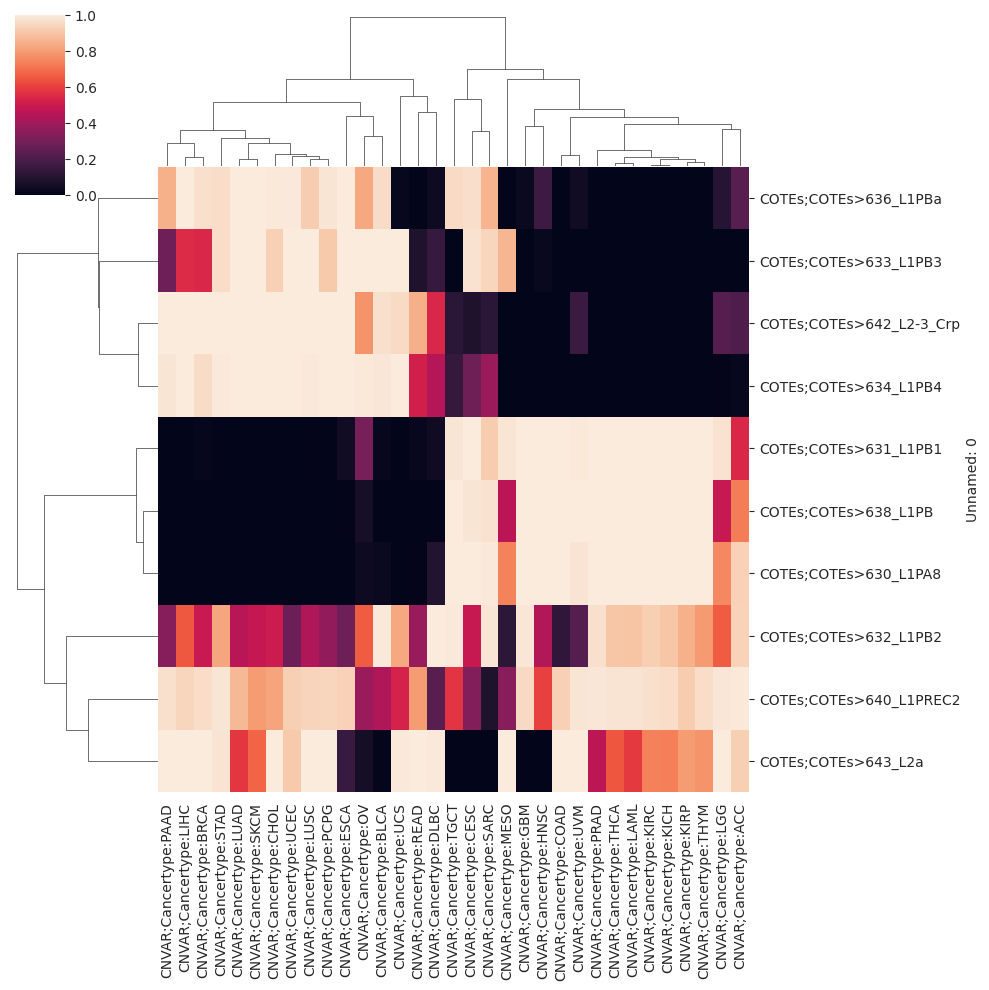

In [147]:
df = pvalues['spearman_correlation']['chr1']
df = df.set_index('Unnamed: 0')
sns.clustermap(df)

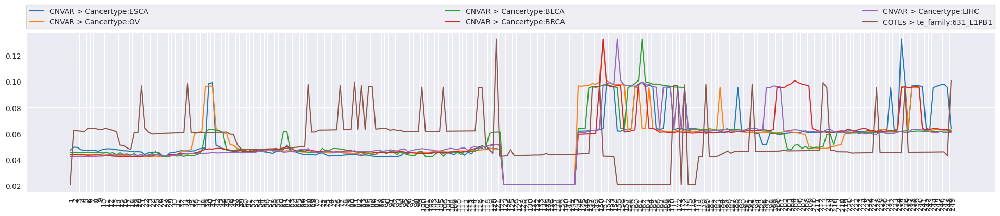

In [215]:
ca.pl.match_layers(ind.chr, layers=['CNVAR', 'COTEs'], 
                   groups={'CNVAR':{'Cancertype':['ESCA', 'OV', 'BLCA', 'BRCA', 'LIHC']}, 'COTEs':{'te_family':['631_L1PB1']}}, 
                   chr='chr1', 
                   normal_y=True, 
                   qnormalize=True, 
                   aggregation='sum')

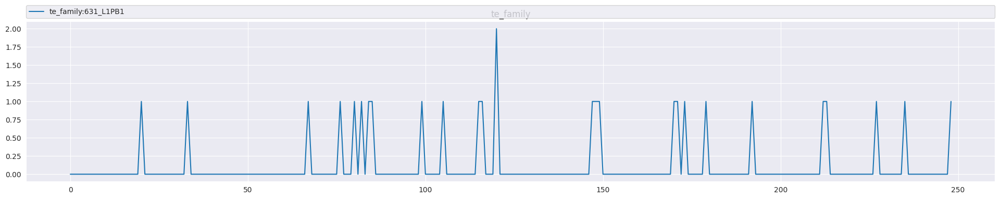

In [213]:
ca.pl.plot_layer(ind.chr, 'COTEs', chr='chr1', groups={'te_family':['631_L1PB1']}, aggregation='sum', normal_y=False)